<a href="https://colab.research.google.com/github/varuntulsian2001/density_estimation_diffusion_models/blob/master/5.colab_EMNIST.diffusion_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generating complex densities using Diffusion models

1. moving to alphabets and number generation using diffusion models
    * We will be using JAX
    * Using U-net blocks for modelling the denoising process

In [1]:
!pip install einops dm-haiku optax
!pip install dm-tree graphviz imageio[ffmpeg]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 535 kB/s 
     |████████████████████████████████| 352 kB 55.5 MB/s 
     |████████████████████████████████| 154 kB 70.3 MB/s 
     |████████████████████████████████| 85 kB 4.5 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.9 MB 1.2 MB/s 


In [2]:
import haiku as hk
import jax
import jax.numpy as jnp
import einops
import math
from typing import Iterator, Mapping, Tuple
from copy import deepcopy
import time
from absl import app
import haiku as hk
import matplotlib.pyplot as plt
import jax
import jax.numpy as jnp
import numpy as np
import optax
import tensorflow_datasets as tfds
import tensorflow as tf
from functools import partial
import math
import os

colab = True

if not colab:
  os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
  jax.config.update('jax_platform_name', 'cpu')
Batch = Tuple[np.ndarray, np.ndarray]

In [3]:
if colab:
  from google.colab import drive
  drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
train_new_model = True

import os
import os.path as osp

if not colab:
  data_paths = osp.join(os.getcwd(), 'saved', 'saved_data')
  model_paths = osp.join(os.getcwd(), 'saved','saved_models')
  gifs_dir = osp.join(os.getcwd(), 'gifs')+"/"
  dataset_path = osp.join(os.getcwd(), 'datasets')+"/"
else:
  data_paths = F"/content/gdrive/MyDrive/EMNIST/data/"
  model_paths = F"/content/gdrive/MyDrive/EMNIST/model/"
  gifs_dir = F"/content/gdrive/MyDrive/EMNIST/gifs/"
  dataset_path = F"/content/gdrive/MyDrive/EMNIST/dataset/"

In [5]:
# utils 
import pickle

def load_cached(filename):
    with open(filename, 'rb') as ff:
        return pickle.load(ff)
    
def write_cached(data, filename):
    with open(filename, 'wb') as ff:
        pickle.dump(data, ff, protocol=pickle.HIGHEST_PROTOCOL)

In [6]:
# train model

# ####### i am not getting desired results with the cosine beta schedule from the hugging face repo
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = jnp.linspace(0, timesteps, steps)
    alphas_cumprod = jnp.cos(((x / timesteps) + s) / (1 + s) * jnp.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return jnp.clip(betas, 0.0001, 0.05)

def linear_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return jnp.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return jnp.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    betas = jnp.linspace(-6, 6, timesteps)
    return jnp.sigmoid(betas) * (beta_end - beta_start) + beta_start

In [7]:
# Train model
timesteps = 200
# betas = linear_beta_schedule(timesteps)
betas = cosine_beta_schedule(timesteps)
alphas = 1 - betas
alphas_ = jnp.cumprod(alphas, axis=0)
variance = 1 - alphas_
sd = jnp.sqrt(variance)

alphas_prev_ = jnp.pad(alphas_[:-1], [1, 0], "constant", constant_values=1.0)
sigma_squared_q_t = (1 - alphas) * (1 - alphas_) / (1 - alphas_prev_)
log_sigma_squared_q_t = jnp.log(1-alphas) + jnp.log(1-alphas_) - jnp.log(1-alphas_prev_)
sigma_squared_q_t_corrected = jnp.exp(log_sigma_squared_q_t)

# how to add noise to the data
# @jax.jit
def get_noisy(batch, timestep):
    timestep = einops.repeat(timestep, 'b -> b 28 28 1')
    # we will use the reparameterization trick
    key = jax.random.PRNGKey(42)
    # need to generate new keys everytime
    noise_at_t = jax.random.normal(key, shape=batch.shape)
    added_noise_at_t = jnp.add(batch * jnp.sqrt(alphas_[timestep]), noise_at_t * sd[timestep])
    return added_noise_at_t, noise_at_t

def recover_original(batch, timestep, noise):
    true_data = (batch.sub(noise.mul(sd[timestep]))).div(jnp.sqrt(alphas_[timestep]))
    return true_data

posterior_variance = (betas) * (1 - alphas_prev_) / (1 - alphas_)

## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L196
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L78
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance[1], posterior_variance[1:]]))

# not sure why we are multiplying by 1/2 here
posterior_variance_corrected = jnp.exp(log_posterior_variance)

([<matplotlib.lines.Line2D at 0x7f2c68362b50>],
 [<matplotlib.lines.Line2D at 0x7f2c68264d90>])

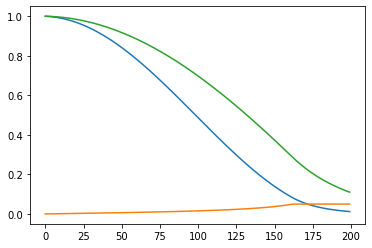

In [8]:
plt.plot(alphas_), plt.plot(posterior_variance_corrected), plt.plot(jnp.sqrt(alphas_))

In [9]:
EMNIST_MEAN = (0.13066373765468597)
EMNIST_STD = (0.30810782313346863)

# adapted from Optax loss -- https://github.com/deepmind/optax/blob/master/optax/_src/loss.py
def huber_loss(
    predictions,
    targets= None,
    delta= 1.):
  """Huber loss, similar to L2 loss close to zero, L1 loss away from zero.
  If gradient descent is applied to the `huber loss`, it is equivalent to
  clipping gradients of an `l2_loss` to `[-delta, delta]` in the backward pass.
  References:
    [Huber, 1964](www.projecteuclid.org/download/pdf_1/euclid.aoms/1177703732)
  Args:
    predictions: a vector of arbitrary shape `[...]`.
    targets: a vector with shape broadcastable to that of `predictions`;
      if not provided then it is assumed to be a vector of zeros.
    delta: the bounds for the huber loss transformation, defaults at 1.
  Returns:
    elementwise huber losses, with the same shape of `predictions`.
  """
  errors = (predictions - targets) if (targets is not None) else predictions
  # 0.5 * err^2                  if |err| <= d
  # 0.5 * d^2 + d * (|err| - d)  if |err| > d
  abs_errors = jnp.abs(errors)
  quadratic = jnp.minimum(abs_errors, delta)
  # Same as max(abs_x - delta, 0) but avoids potentially doubling gradient.
  linear = abs_errors - quadratic
  return jnp.sum(0.5 * quadratic ** 2 + delta * linear, axis=(1, 2, 3))

def load_dataset(
    split: str,
    *,
    is_training: bool,
    batch_size: int,
) -> Iterator[tuple]:
  """Loads the dataset as a generator of batches."""
  # cache the dataset to memory and repeat it indefinitely, epochs have reshuffled ordered data since *reshuffle_each_iteration* defaults to TRUE
  ds = tfds.load('emnist', split=split, data_dir=dataset_path, as_supervised=True).cache().repeat()
  if is_training:
    # shuffle the batches to improve generalization of the trained network
    ds = ds.shuffle(400 * batch_size, seed=0)
  ds = ds.batch(batch_size)
  return iter(tfds.as_numpy(ds))

# Recommended: this can be jit'd and it should result in faster training time 
@jax.jit
def compute_loss(params: hk.Params, batch: Batch, is_energy_method: bool=False) -> jnp.ndarray:
  """Compute the loss of the network, including L2."""
  x, _, timestep, noise = batch
  pred_data = net.apply(params, x, timestep)
  
  def error_func():
    imp_weight = 1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (variance[timestep] * alphas[timestep]))
      # loss on prediction
    loss_ = jnp.sum(jnp.multiply(imp_weight, huber_loss(noise, pred_data)))
    return loss_
  
  def energy_func():
    ## Energy function interpretation
    imp_weight = 1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (alphas[timestep]))
    # loss on prediction
    loss_ = jnp.sum(jnp.multiply(imp_weight, huber_loss(pred_data, jnp.divide(noise, -sd[timestep]))))
    return loss_
    
  loss_ = jax.lax.cond(is_energy_method, energy_func, error_func)
  return loss_ 

@jax.jit
def update(
    params: hk.Params,
    opt_state: optax.OptState,
    batch: Batch,
    is_energy_method: bool=False
) -> Tuple[hk.Params, optax.OptState]:
  """Compute gradients and update the weights"""
  loss_value, grads = jax.value_and_grad(compute_loss)(params, batch, is_energy_method)
  updates, opt_state = opt.update(grads, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss_value, new_params, opt_state

@jax.jit
def ema_update(params, avg_params):
  """Incrementally update parameters via polyak averaging."""
  # Polyak averaging tracks an (exponential moving) average of the past parameters of a model, for use at test/evaluation time.
  return optax.incremental_update(params, avg_params, step_size=0.95)

@jax.jit
def normalize(images):
  # numpy array creation could be moved out of the method
  mean = np.asarray(EMNIST_MEAN)
  std = np.asarray(EMNIST_STD)

  # BUG 3: int8 range is -128 to 127 causing issues with numbers > 127, uint8 / 255. is float64, casting as float32 since that's the type jax prefers
  x = images.astype(jnp.float32) / 255.

  # BUG 4: x /- mean just divides x by -1. * mean without reassignment to x
  x -= mean  # operations uses numpy broadcasting to work correctly
  x /= std 

  return x

@jax.jit
def unnormalize(images):
  mean = np.asarray(EMNIST_MEAN)
  std = np.asarray(EMNIST_STD)

  # BUG 3: int8 range is -128 to 127 causing issues with numbers > 127, uint8 / 255. is float64, casting as float32 since that's the type jax prefers
  x = images.astype(jnp.float32)

  # BUG 4: x /- mean just divides x by -1. * mean without reassignment to x
  x *= std 
  x += mean  # operations uses numpy broadcasting to work correctly
  
  return x*255.
  

In [10]:
# using 20% of the dataset for training, 80% for validation, although it's weird to use maximum available data for validation
# BUG: using 80% train data, since performance improvement beyond 50% wasn't seen with 20% train data
batch_size=512
train = load_dataset("train+test", is_training=True, batch_size=batch_size)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/697932 [00:00<?, ? examples/s]

Shuffling ~/tensorflow_datasets/emnist/byclass/3.0.0.incompleteUXDKYI/emnist-train.tfrecord*...:   0%|        …

Generating test examples...:   0%|          | 0/116323 [00:00<?, ? examples/s]

Shuffling ~/tensorflow_datasets/emnist/byclass/3.0.0.incompleteUXDKYI/emnist-test.tfrecord*...:   0%|         …

Dataset emnist downloaded and prepared to ~/tensorflow_datasets/emnist/byclass/3.0.0. Subsequent calls will reuse this data.


In [11]:
%%capture 
# % matplotlib inline 
# to discard cell output

import matplotlib.animation as animation
import imageio 
from IPython.display import Image
from matplotlib.pyplot import figure

random_index = 22
image = next(train)[0][random_index]
fig = plt.figure()
ims = []
noisy_images, _ = get_noisy(einops.repeat(normalize(image), 'h w c -> b h w c', b=timesteps//10), jnp.arange(1, timesteps, 10))
if colab:
  noisy_images = einops.rearrange(noisy_images, 'b h w c -> b h (w c)')
noisy_images = unnormalize(noisy_images)

for i in range(timesteps//10):
    im = plt.imshow(noisy_images[i], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir+'diffusion.gif', writer='pillow')

def show_image(img, plt_):
  figure(figsize=(2, 2))
  if colab:
    img = einops.rearrange(img, 'h w c -> h (w c)')
  plt_.imshow(img, cmap="gray", animated=False)

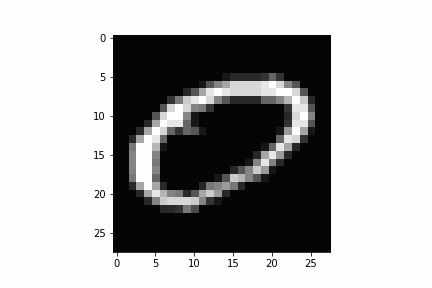

In [12]:
with open(gifs_dir + 'diffusion.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

In [13]:
# upsample operation in the UNET
class Downsample(hk.Module):
  def __init__(self, output_channels):
    super().__init__()
    self.conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(4, 4), stride=2, padding=[1, 1])
  
  def __call__(self, x):
    return jax.nn.selu(self.conv(x))
  
# Downsample operation in the UNET
class Upsample(hk.Module):
  def __init__(self, output_channels):
    super().__init__()
    self.conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(3, 3), padding='SAME')
  
  def __call__(self, x):
    # scaling image to twice size
    x = einops.repeat(x, 'b h w c -> b (a h) (aa w) c', a=2, aa=2)
    return jax.nn.selu(self.conv(x))
      
class TimeEmbeddings(hk.Module):
  def __init__(self, dim):
    super().__init__()
    half_dim = dim // 2
    embeddings = math.log(10000) / (half_dim - 1)
    self.embeddings = jnp.exp(jnp.arange(half_dim) * -embeddings)

  def __call__(self, timesteps):
      embeddings = self.embeddings
      embeddings = jnp.multiply(timesteps[:, None], embeddings[:, None].T)
      embeddings = jnp.hstack([jnp.sin(embeddings), jnp.cos(embeddings)])
      return embeddings

class Block(hk.Module):
  # a basic resnet style convolutional block
  def __init__(self, output_channels, kernel_size, padding):
    super().__init__()
    self.conv_1 = hk.Conv2D(output_channels=output_channels, kernel_shape=(kernel_size, kernel_size), padding='SAME')
    self.seq = hk.Sequential([
      jax.nn.selu,
      hk.Conv2D(output_channels=output_channels, kernel_shape=(kernel_size, kernel_size), padding='SAME'),
      jax.nn.selu,
    ])
    self.out_conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(1, 1), padding='SAME') 
    # self.time_mlp = None
    dims = output_channels
    self.time_mlp = hk.Sequential([
      TimeEmbeddings(dims),
      hk.Linear(dims*2),
      jax.nn.selu
    ])
    
  def __call__(self, x, timesteps=None):
    x = self.conv_1(x)
    if timesteps is not None and self.time_mlp is not None:
      time_embedding = self.time_mlp(timesteps)
      time_embedding = einops.rearrange(time_embedding, 'b c -> b 1 1 c')
      shift, scale = jnp.split(time_embedding, indices_or_sections=2, axis=-1)
      x = shift + (scale+1)*x
    
    h = self.seq(x)
    return jax.nn.selu(self.out_conv(h) + x)

In [14]:
# Unet class to predict noise from a given image
class UNet(hk.Module):
  def __init__(self):
    super().__init__()
    self.init_conv = hk.Conv2D(output_channels=1, kernel_shape = (5,5), padding='SAME')
    self.selu1 = jax.nn.selu
    self.block1 = Block(output_channels=32, kernel_size=3, padding=1)
    self.downsample1 = Downsample(64)
    self.block2 = Block(output_channels=64, kernel_size=3, padding=1)
    self.downsample2 = Downsample(128)
    self.middle_block = Block(output_channels=128, kernel_size=3, padding=1)
    self.upsample1 = Upsample(64)
    self.block3 = Block(output_channels=64, kernel_size=3, padding=1)
    self.upsample2 = Upsample(32)
    self.block4 = Block(output_channels=32, kernel_size=3, padding=1)
    self.out_conv = hk.Conv2D(output_channels=1, kernel_shape = (5,5), padding='SAME')
      
  def __call__(self, x, timesteps):
    h = self.selu1(self.init_conv(x))
    h = self.downsample1(self.block1(h, timesteps))
    h = self.downsample2(self.block2(h, timesteps))
    h = self.upsample1(self.middle_block(h, timesteps))
    h = self.upsample2(self.block3(h, timesteps))
    h = self.block4(h, timesteps)
    h = self.out_conv(h)
    return h

In [15]:
import graphviz

def f(x, timesteps):
  unet = UNet()
  return unet(x, timesteps)

f_t = hk.transform(f)

x = jnp.ones([1, 28, 28, 1])
timesteps_ = jnp.arange(0, 1)

rng = jax.random.PRNGKey(42)
params = f_t.init(rng, x, timesteps_)

# dot = hk.experimental.to_dot(f_t.apply)(params, None, x, timesteps)
# graphviz.Source(dot)

# print(hk.experimental.tabulate(f_t)(x, timesteps_))



---




### Training

In [16]:
# net_fn = UNet()
net = hk.without_apply_rng(f_t)

# Do not change learning rate
opt = optax.adam(1e-3)

# Recommended: param objects should be deepcopied, although in this case it doesn't cause issues
# we draw an input to get shapes.
# params = net.init(jax.random.PRNGKey(42), next(train), timesteps_)
avg_params = deepcopy(params)
opt_state = opt.init(params)

In [17]:
def save(ckpt_dir: str, state, model_name) -> None:
  with open(os.path.join(ckpt_dir, model_name+"_arrays.npy"), "wb") as f:
    for x in jax.tree_util.tree_leaves(state):
         np.save(f, x, allow_pickle=False)
    tree_struct = jax.tree_map(lambda t: 0, state)
  with open(os.path.join(ckpt_dir, model_name+"_tree.pkl"), "wb") as f:
     pickle.dump(tree_struct, f)

def restore(ckpt_dir, model_name):
  with open(os.path.join(ckpt_dir, model_name+"_tree.pkl"), "rb") as f:
    tree_struct = pickle.load(f)
 
  leaves, treedef = jax.tree_util.tree_flatten(tree_struct)
  with open(os.path.join(ckpt_dir, model_name+"_arrays.npy"), "rb") as f:
    flat_state = [np.load(f) for _ in leaves]

  return jax.tree_util.tree_unflatten(treedef, flat_state)

def test_model_save():
  save('saved/saved_models/', avg_params, 'emnist_model')
  avg_params = restore('saved/saved_models/', 'emnist_model')

In [18]:
def show_predicted_image(noisy_image, params, timestep):
  print('time step for image', timestep)
  timestep = jnp.array([timestep])
  pred_noise = net.apply(params, noisy_image, timestep)
  pred_image = noisy_image/jnp.sqrt(alphas_[timestep]) - pred_noise*sd[timestep]/jnp.sqrt(alphas_[timestep])
  _, (p1, p2) = plt.subplots(1, 2)
  show_image(unnormalize(pred_image[0]), p1)
  show_image(unnormalize(noisy_image[0]), p2)
  plt.show()
  return huber_loss(noisy_image, pred_image)
  
# show random images
# show_predicted_image(x, avg_params, 10)

time step for image 199


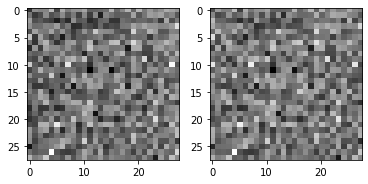

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

[5062.327]


In [19]:
def test_loss_fn():
  b, l = next(train)
  b = normalize(b)
  loss_ = []
  huber_loss_ = []
  huber_loss_weighted = []
  imp_weight_ = []
  model_huber_loss = []
  for i in range(1, timesteps):
    tt = jnp.array([i])
    data_noisy_temp, noise_temp = get_noisy(b, tt)
    loss_.append(jax.device_get(compute_loss(avg_params, [einops.rearrange(data_noisy_temp[0], 'h w c -> 1 h w c'), jax.nn.one_hot(l, 63), tt, 
                                                          einops.rearrange(noise_temp[0], 'h w c -> 1 h w c')], False)))
    huber_loss__ = huber_loss(data_noisy_temp[0:2], b[0:2])
    huber_loss_.append(huber_loss__)
    
    imp_weight = 1/2 * (1/sigma_squared_q_t_corrected[tt]) * ((betas[tt])**2 / (variance[tt] * alphas[tt]))
    # loss on prediction
    huber_loss_weighted.append(jnp.sum(jnp.multiply(imp_weight, huber_loss__)))
    imp_weight_.append(imp_weight)
    
    pp = net.apply(avg_params, einops.rearrange(data_noisy_temp[0], 'h w c -> 1 h w c'), tt)
    model_huber_loss.append(huber_loss(einops.rearrange(pp[0], 'h w c -> 1 h w c'), einops.rearrange(noise_temp[0], 'h w c -> 1 h w c')))
    
  print(show_predicted_image(einops.rearrange(data_noisy_temp[0], 'h w c -> 1 h w c'), avg_params, i))
  return loss_, huber_loss_, huber_loss_weighted, imp_weight_, model_huber_loss
  
loss_, huber_loss_, huber_loss_weighted, imp_weight_, model_huber_loss = test_loss_fn()

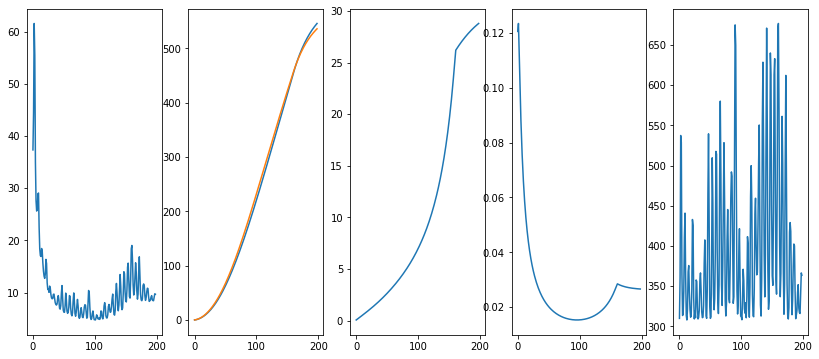

In [20]:
_, (plt1, plt2, plt3, plt4, plt5) = plt.subplots(1,5, figsize=(14, 6))

plt1.plot(loss_)
plt2.plot(huber_loss_)
plt3.plot(huber_loss_weighted)
plt4.plot(imp_weight_)
plt5.plot(model_huber_loss)

In [21]:
from copy import deepcopy
import pickle
import sys

batches_iter = 10000

def train_model(opt_state, params, avg_params, model_name, train_new_model=False, energy_method=False, cont=True):
    best_loss = sys.float_info.max # initialization
        
    if cont and os.path.exists(osp.join(data_paths, model_name + '_state.pt')):
      params = avg_params = restore(model_paths, model_name)
    if train_new_model or not os.path.exists(osp.join(data_paths, model_name + '_state.pt')):
        key = jax.random.PRNGKey(42)
        subkeys = jax.random.split(key, batches_iter)
        losses = []
        for iteration in range(0, batches_iter):
            data_in_batch, label = next(train)
            data_in_batch = normalize(data_in_batch)
            label_one_hot = jax.nn.one_hot(label, 63)
            idx = jnp.multiply(jax.random.uniform(key=subkeys[iteration], shape=(batch_size, 1)), timesteps-1).astype(int)
            idx = einops.rearrange(idx, 'a b -> (a b)')
            timestep = idx + 1
            data_noisy, noise = get_noisy(data_in_batch, timestep)
            # todo: call gradient update function here
            loss_value, params, opt_state = update(params, opt_state, [data_noisy, label_one_hot, timestep, noise], energy_method)
            avg_params = ema_update(params, avg_params)
            
            if iteration % 10 == 0:
              print("loss value: ", loss_value)
            
            if iteration % 50 == 0:              
                ## evaluating noise on a fixed timestep to calculate best model
                one_timestep = jnp.mod(jnp.arange(1, batch_size+1), timesteps)
                data_noisy_temp, noise_temp = get_noisy(data_in_batch, one_timestep)
                loss_temp = jax.device_get(compute_loss(avg_params, [data_noisy_temp, label_one_hot, one_timestep, noise_temp], energy_method))
                losses.append(loss_temp)
                print('batch loss value', loss_value)
            
                if loss_temp < best_loss:
                    best_loss = loss_temp
                    print(f"saving iteration * batch_size: {iteration*batch_size} loss: {best_loss:>7f}")
                    save(model_paths, avg_params, model_name)
                    write_cached([data_noisy, data_in_batch, timestep, losses], osp.join(data_paths, model_name + '_state.pt'))
                    # sample a random number
                    r_ = (jax.random.uniform(subkeys[iteration])*batch_size).astype(int)
                    show_predicted_image(einops.rearrange(data_noisy_temp[r_], 'h w c -> 1 h w c'), avg_params, (r_+1)%timesteps)
            
                if iteration % 100 == 0:
                    print(f"iteration * batch_size: {iteration*batch_size} loss: {loss_temp:>7f}")

    if os.path.exists(osp.join(data_paths, model_name + '_state.pt')):
        avg_params = restore(model_paths, model_name)
        data_noisy, data_in_batch, timestep, losses = load_cached(osp.join(data_paths, model_name + '_state.pt')) 
    return data_noisy, data_in_batch, timestep, losses, avg_params

batch loss value 2757.6953
saving iteration * batch_size: 0 loss: 3297.152344
time step for image 56


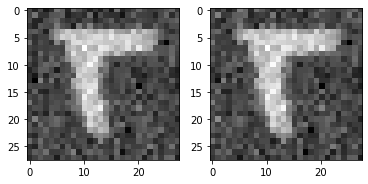

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 0 loss: 3297.152344
batch loss value 2227.714
saving iteration * batch_size: 2560 loss: 2588.947754
time step for image 123


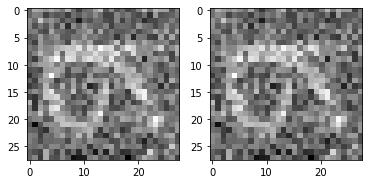

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2355.6328
saving iteration * batch_size: 5120 loss: 2562.949219
time step for image 137


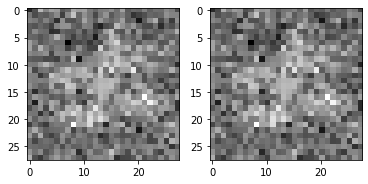

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2403.163
saving iteration * batch_size: 7680 loss: 2555.805664
time step for image 153


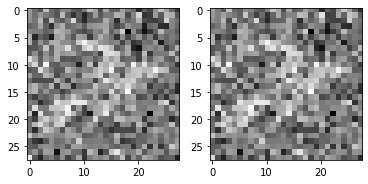

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2339.0598
saving iteration * batch_size: 10240 loss: 2553.405273
time step for image 146


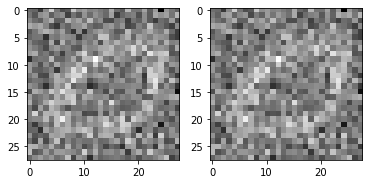

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2381.1245
saving iteration * batch_size: 12800 loss: 2552.069824
time step for image 148


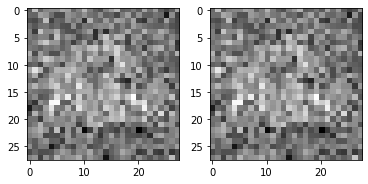

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2175.4292
saving iteration * batch_size: 15360 loss: 2550.848145
time step for image 195


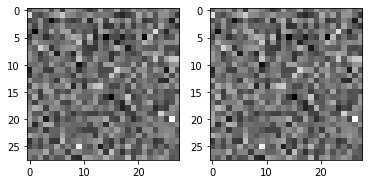

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2280.9219
saving iteration * batch_size: 17920 loss: 2550.147705
time step for image 172


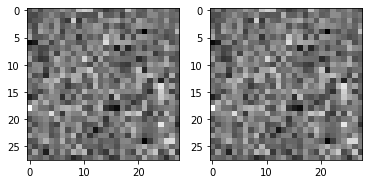

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2478.4653
saving iteration * batch_size: 20480 loss: 2549.303711
time step for image 45


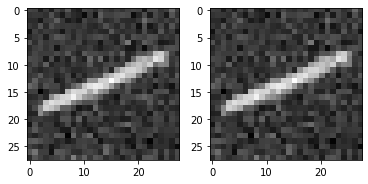

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2494.203
saving iteration * batch_size: 23040 loss: 2549.014648
time step for image 16


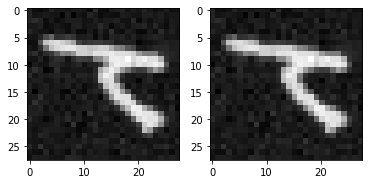

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2287.456
saving iteration * batch_size: 25600 loss: 2548.628418
time step for image 35


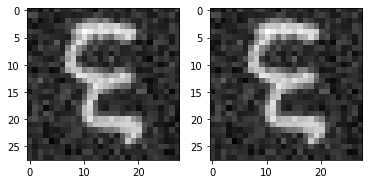

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 25600 loss: 2548.628418
batch loss value 2343.022
saving iteration * batch_size: 28160 loss: 2548.248535
time step for image 170


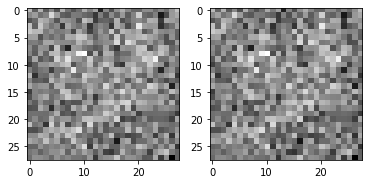

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2352.132
saving iteration * batch_size: 30720 loss: 2547.672119
time step for image 3


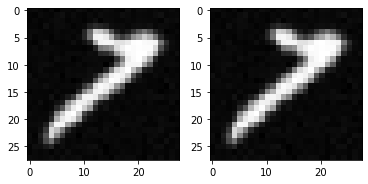

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2166.0444
saving iteration * batch_size: 33280 loss: 2547.378906
time step for image 48


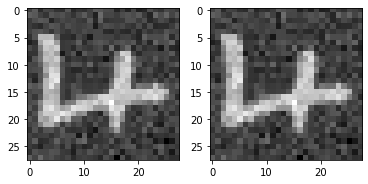

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2361.6055
batch loss value 2103.0386
saving iteration * batch_size: 38400 loss: 2546.881348
time step for image 18


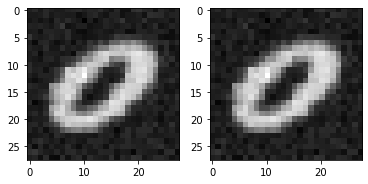

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2255.8154
saving iteration * batch_size: 40960 loss: 2546.595459
time step for image 44


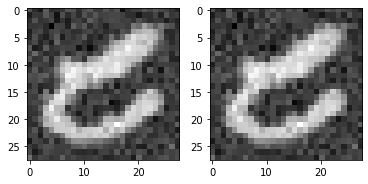

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2250.0796
saving iteration * batch_size: 43520 loss: 2546.416992
time step for image 111


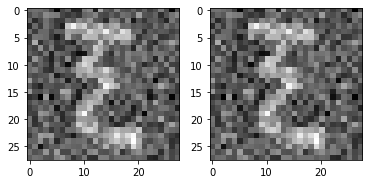

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2244.0342
saving iteration * batch_size: 46080 loss: 2546.128418
time step for image 124


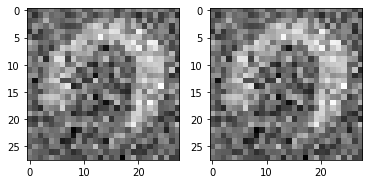

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2383.0254
saving iteration * batch_size: 48640 loss: 2546.079834
time step for image 11


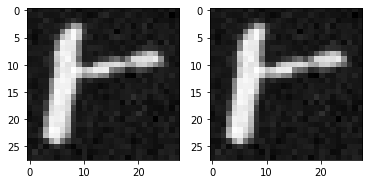

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2391.9976
saving iteration * batch_size: 51200 loss: 2546.002197
time step for image 88


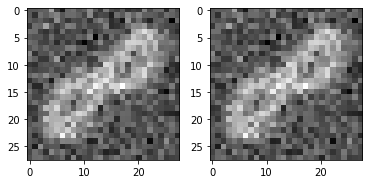

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 51200 loss: 2546.002197
batch loss value 2270.2544
saving iteration * batch_size: 53760 loss: 2545.926758
time step for image 84


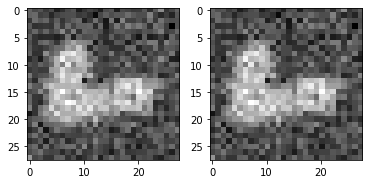

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2216.708
saving iteration * batch_size: 56320 loss: 2545.868164
time step for image 9


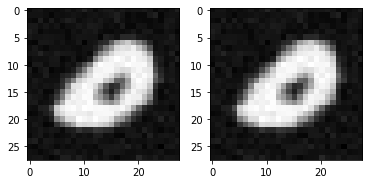

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2207.0337
saving iteration * batch_size: 58880 loss: 2545.635254
time step for image 189


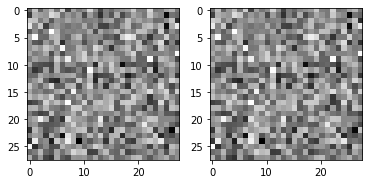

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2407.4978
batch loss value 2333.2437
batch loss value 2138.5176
saving iteration * batch_size: 66560 loss: 2545.462402
time step for image 180


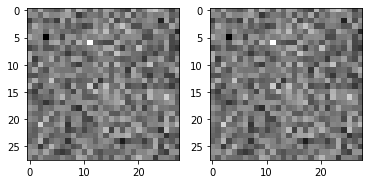

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2175.6636
saving iteration * batch_size: 69120 loss: 2545.440918
time step for image 198


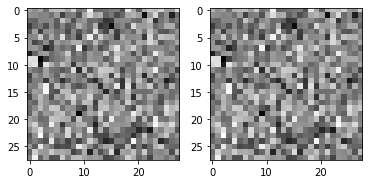

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2295.2632
batch loss value 2230.3323
saving iteration * batch_size: 74240 loss: 2545.291992
time step for image 12


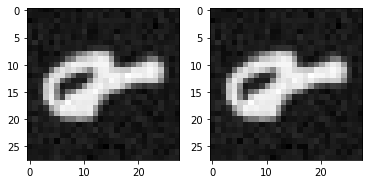

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2315.605
saving iteration * batch_size: 76800 loss: 2545.102051
time step for image 186


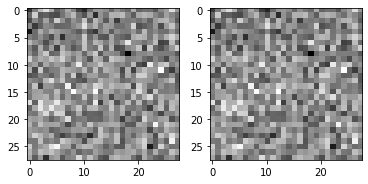

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 76800 loss: 2545.102051
batch loss value 2179.378
saving iteration * batch_size: 79360 loss: 2545.085693
time step for image 36


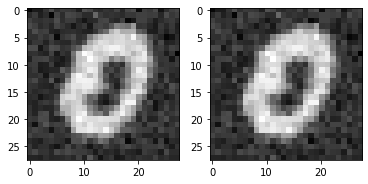

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2249.88
batch loss value 2195.4492
saving iteration * batch_size: 84480 loss: 2544.923828
time step for image 75


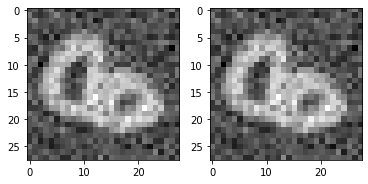

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2198.564
saving iteration * batch_size: 87040 loss: 2544.755371
time step for image 23


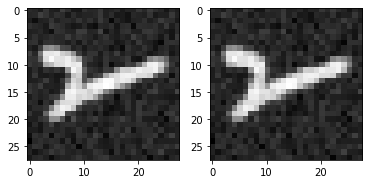

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2364.9678
batch loss value 2281.4236
saving iteration * batch_size: 92160 loss: 2544.514160
time step for image 167


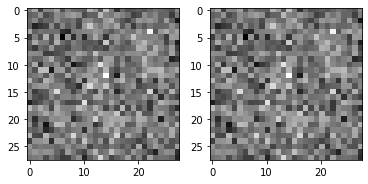

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2223.1182
saving iteration * batch_size: 94720 loss: 2544.417725
time step for image 129


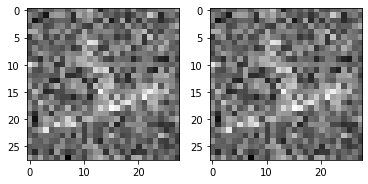

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2222.343
batch loss value 2183.0894
batch loss value 2275.4019
iteration * batch_size: 102400 loss: 2544.563965
batch loss value 2223.7805
saving iteration * batch_size: 104960 loss: 2544.240967
time step for image 33


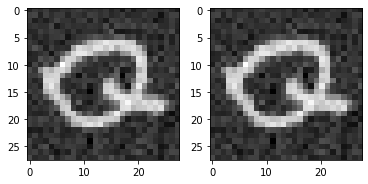

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2303.542
batch loss value 2132.253
saving iteration * batch_size: 110080 loss: 2544.167480
time step for image 41


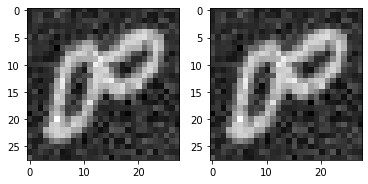

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2171.7373
batch loss value 2304.1326
batch loss value 2289.8027
saving iteration * batch_size: 117760 loss: 2544.090576
time step for image 51


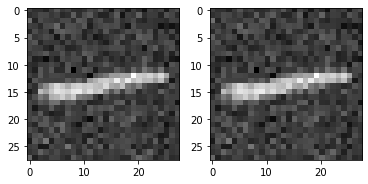

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2390.7441
batch loss value 2217.9036
batch loss value 2270.1157
batch loss value 2327.0378
iteration * batch_size: 128000 loss: 2544.116699
batch loss value 2219.1543
batch loss value 2344.0415
saving iteration * batch_size: 133120 loss: 2543.769775
time step for image 143


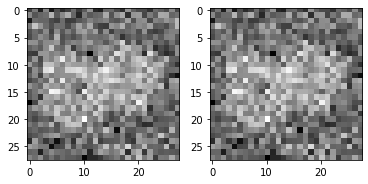

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2345.904
batch loss value 2267.6267
batch loss value 2133.005
saving iteration * batch_size: 140800 loss: 2543.529785
time step for image 29


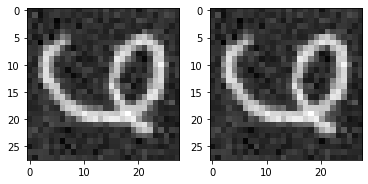

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2289.917
saving iteration * batch_size: 143360 loss: 2543.213867
time step for image 34


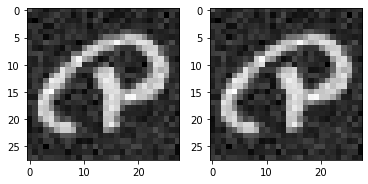

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2329.165
saving iteration * batch_size: 145920 loss: 2543.049072
time step for image 63


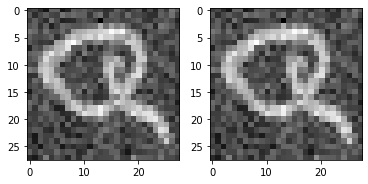

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2141.6338
saving iteration * batch_size: 148480 loss: 2542.668457
time step for image 199


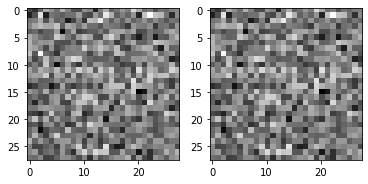

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2129.1138
saving iteration * batch_size: 151040 loss: 2542.376221
time step for image 112


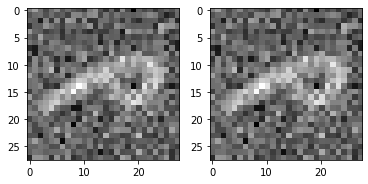

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2230.016
saving iteration * batch_size: 153600 loss: 2541.849121
time step for image 37


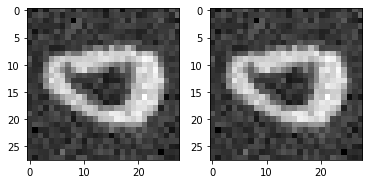

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 153600 loss: 2541.849121
batch loss value 2292.0854
saving iteration * batch_size: 156160 loss: 2541.360840
time step for image 175


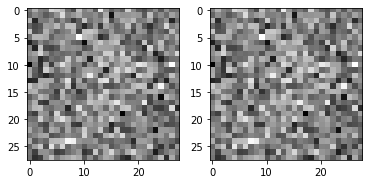

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2231.3516
saving iteration * batch_size: 158720 loss: 2539.313965
time step for image 99


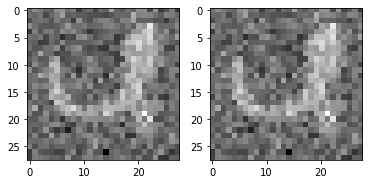

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2162.7996
saving iteration * batch_size: 161280 loss: 2538.102539
time step for image 20


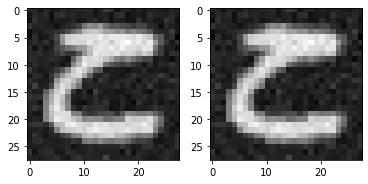

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2277.945
saving iteration * batch_size: 163840 loss: 2535.414551
time step for image 13


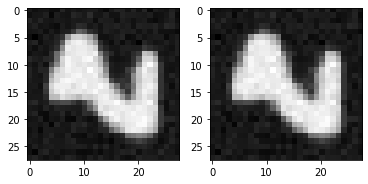

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2259.2585
saving iteration * batch_size: 166400 loss: 2532.334229
time step for image 187


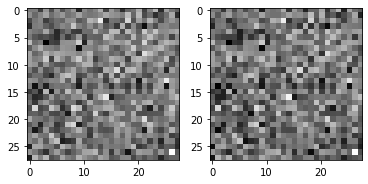

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2229.9058
saving iteration * batch_size: 168960 loss: 2529.595215
time step for image 42


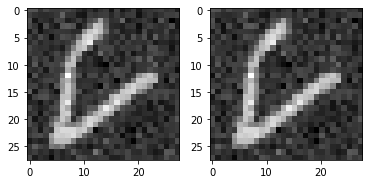

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2427.7073
saving iteration * batch_size: 171520 loss: 2525.015137
time step for image 190


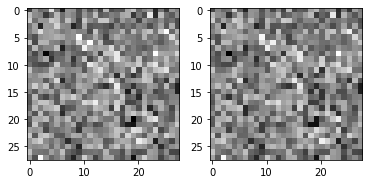

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2245.885
saving iteration * batch_size: 174080 loss: 2519.989746
time step for image 108


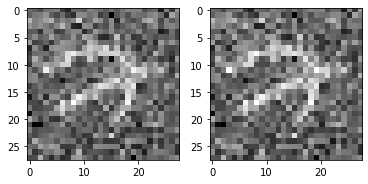

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2105.5557
saving iteration * batch_size: 176640 loss: 2514.395996
time step for image 134


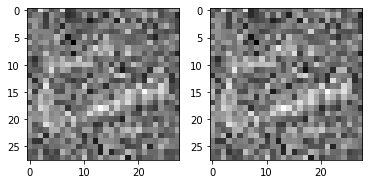

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2223.4712
saving iteration * batch_size: 179200 loss: 2508.188721
time step for image 55


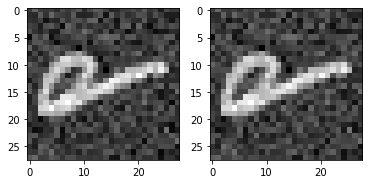

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 179200 loss: 2508.188721
batch loss value 2334.8477
saving iteration * batch_size: 181760 loss: 2501.284180
time step for image 97


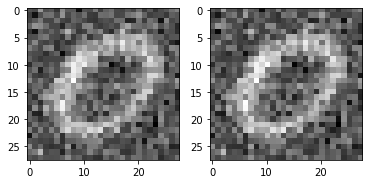

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2075.0527
saving iteration * batch_size: 184320 loss: 2493.117676
time step for image 60


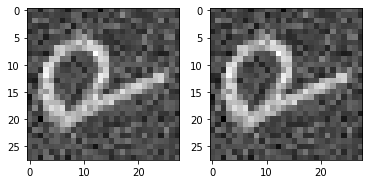

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2228.6206
saving iteration * batch_size: 186880 loss: 2486.007080
time step for image 7


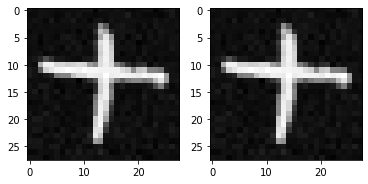

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2123.9224
saving iteration * batch_size: 189440 loss: 2478.062500
time step for image 71


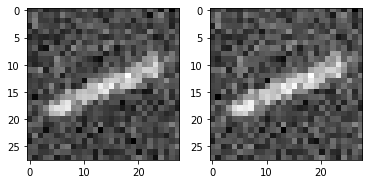

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2335.0654
saving iteration * batch_size: 192000 loss: 2471.361328
time step for image 50


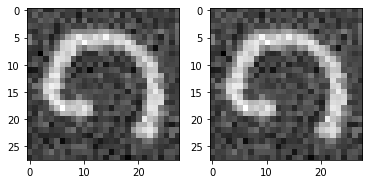

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2172.6646
saving iteration * batch_size: 194560 loss: 2464.092773
time step for image 187


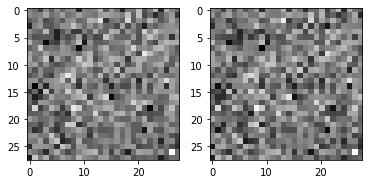

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2104.3196
saving iteration * batch_size: 197120 loss: 2453.793945
time step for image 166


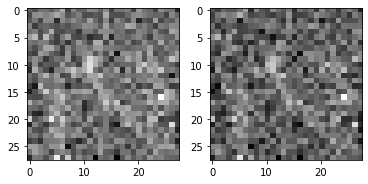

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2068.1606
saving iteration * batch_size: 199680 loss: 2444.009766
time step for image 15


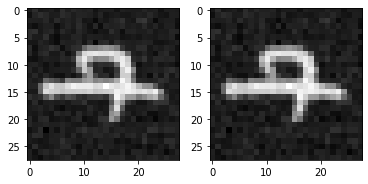

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2111.4458
saving iteration * batch_size: 202240 loss: 2436.360352
time step for image 53


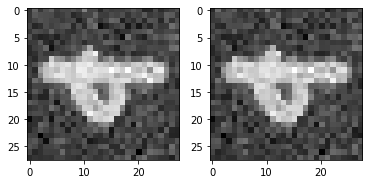

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2057.0605
saving iteration * batch_size: 204800 loss: 2431.150391
time step for image 7


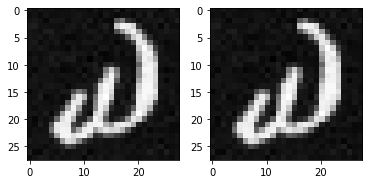

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 204800 loss: 2431.150391
batch loss value 1999.8359
saving iteration * batch_size: 207360 loss: 2417.562012
time step for image 88


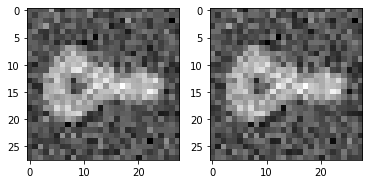

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2165.6694
saving iteration * batch_size: 209920 loss: 2410.214355
time step for image 66


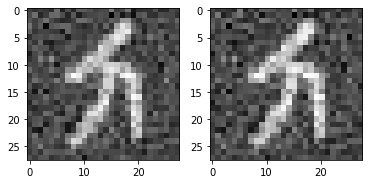

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2167.567
saving iteration * batch_size: 212480 loss: 2400.556152
time step for image 94


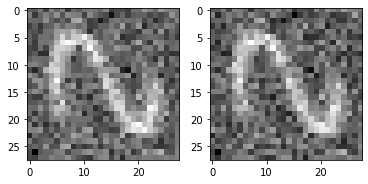

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1984.4365
saving iteration * batch_size: 215040 loss: 2394.657715
time step for image 0


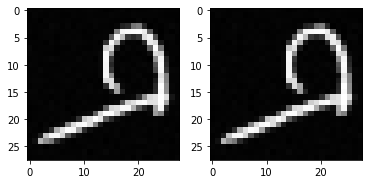

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2146.8892
saving iteration * batch_size: 217600 loss: 2386.648926
time step for image 131


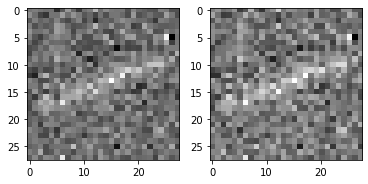

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1973.2631
saving iteration * batch_size: 220160 loss: 2378.515869
time step for image 47


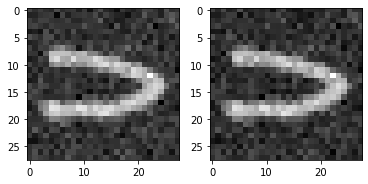

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2068.501
saving iteration * batch_size: 222720 loss: 2368.803711
time step for image 49


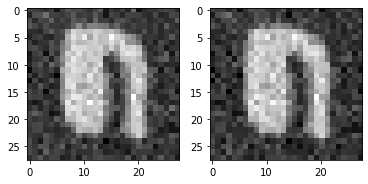

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2134.193
saving iteration * batch_size: 225280 loss: 2356.826172
time step for image 99


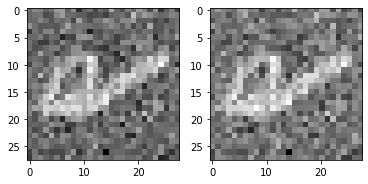

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1906.2396
saving iteration * batch_size: 227840 loss: 2352.675781
time step for image 22


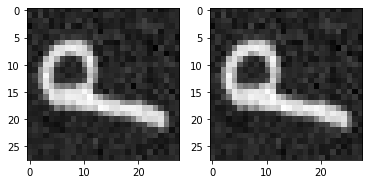

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2050.1536
saving iteration * batch_size: 230400 loss: 2341.880371
time step for image 81


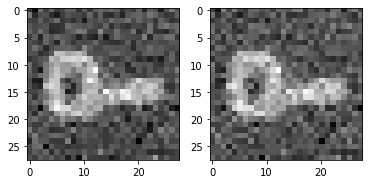

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 230400 loss: 2341.880371
batch loss value 2046.8306
saving iteration * batch_size: 232960 loss: 2332.437012
time step for image 16


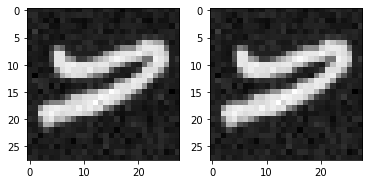

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2355.6357
saving iteration * batch_size: 235520 loss: 2329.194092
time step for image 104


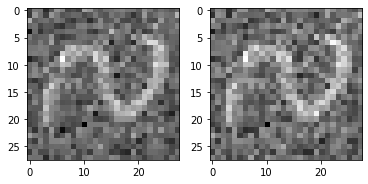

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1963.3412
saving iteration * batch_size: 238080 loss: 2325.071533
time step for image 5


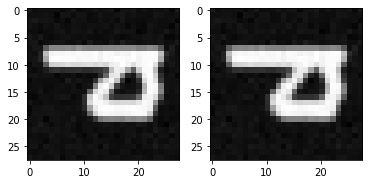

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1854.2097
saving iteration * batch_size: 240640 loss: 2315.710205
time step for image 64


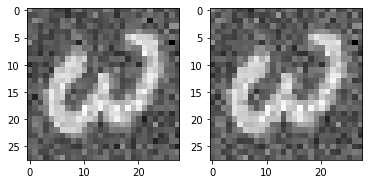

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1895.1989
saving iteration * batch_size: 243200 loss: 2304.355225
time step for image 138


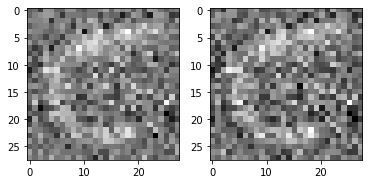

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1922.0297
saving iteration * batch_size: 245760 loss: 2301.093750
time step for image 26


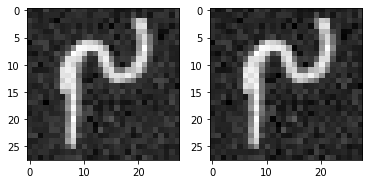

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1932.5067
saving iteration * batch_size: 248320 loss: 2294.491699
time step for image 21


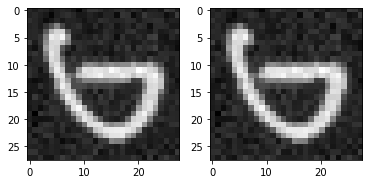

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1800.0942
batch loss value 2001.9835
saving iteration * batch_size: 253440 loss: 2287.698730
time step for image 76


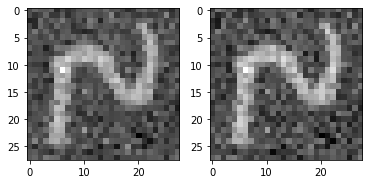

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2005.7179
saving iteration * batch_size: 256000 loss: 2274.851074
time step for image 53


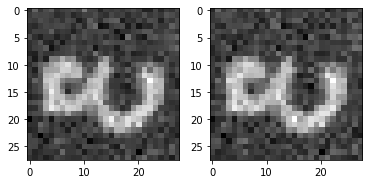

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 256000 loss: 2274.851074
batch loss value 1982.2025
saving iteration * batch_size: 258560 loss: 2272.842773
time step for image 8


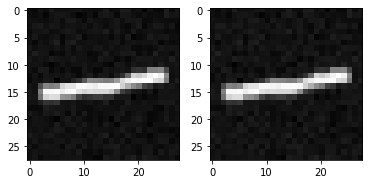

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1832.0504
saving iteration * batch_size: 261120 loss: 2267.025391
time step for image 129


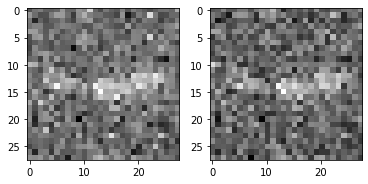

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1955.3958
saving iteration * batch_size: 263680 loss: 2256.184570
time step for image 48


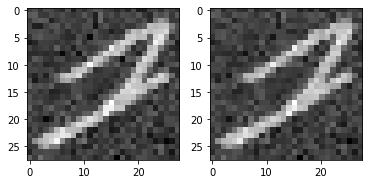

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1806.98
saving iteration * batch_size: 266240 loss: 2246.565918
time step for image 6


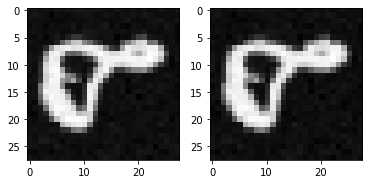

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1857.863
saving iteration * batch_size: 268800 loss: 2241.835938
time step for image 125


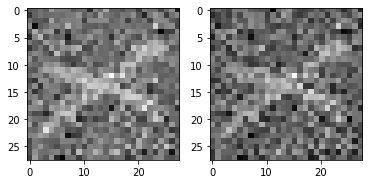

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1752.17
saving iteration * batch_size: 271360 loss: 2238.876465
time step for image 163


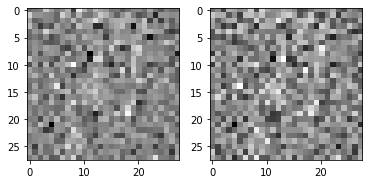

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1873.144
saving iteration * batch_size: 273920 loss: 2233.325195
time step for image 107


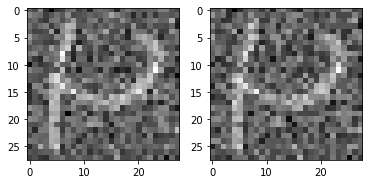

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1797.3145
saving iteration * batch_size: 276480 loss: 2225.564453
time step for image 6


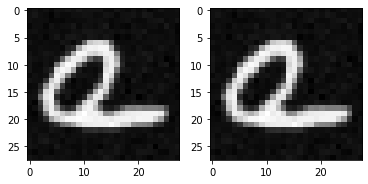

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1898.0392
saving iteration * batch_size: 279040 loss: 2222.030273
time step for image 2


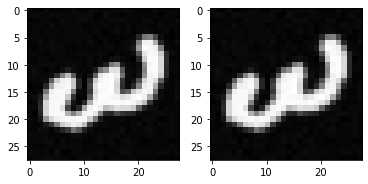

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1945.3905
saving iteration * batch_size: 281600 loss: 2213.055176
time step for image 97


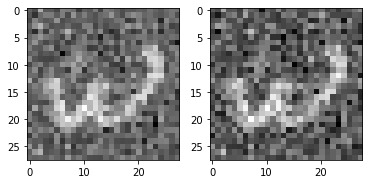

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 281600 loss: 2213.055176
batch loss value 1927.508
batch loss value 2006.782
saving iteration * batch_size: 286720 loss: 2207.767578
time step for image 154


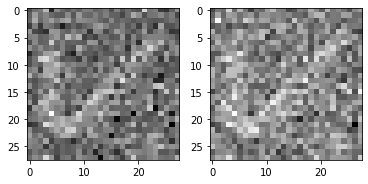

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1867.0234
saving iteration * batch_size: 289280 loss: 2205.693359
time step for image 71


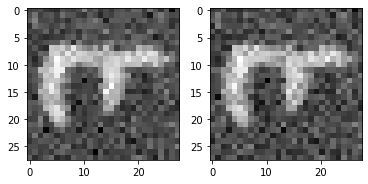

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1868.4889
saving iteration * batch_size: 291840 loss: 2191.826172
time step for image 56


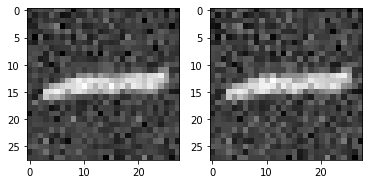

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1899.5977
saving iteration * batch_size: 294400 loss: 2190.910645
time step for image 15


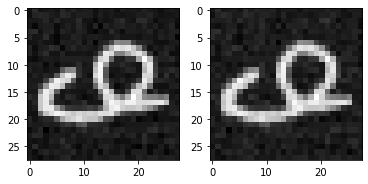

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1754.5396
saving iteration * batch_size: 296960 loss: 2182.469727
time step for image 79


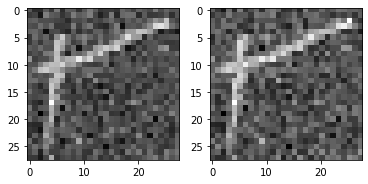

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1793.8146
batch loss value 1842.5854
saving iteration * batch_size: 302080 loss: 2177.612305
time step for image 135


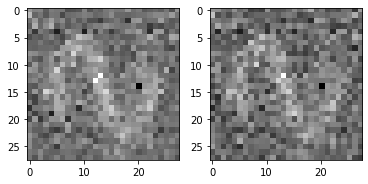

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1824.4022
saving iteration * batch_size: 304640 loss: 2172.415527
time step for image 189


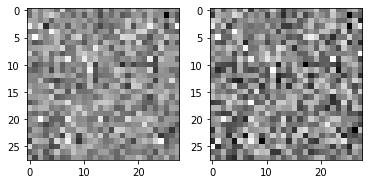

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1681.2642
saving iteration * batch_size: 307200 loss: 2161.034180
time step for image 169


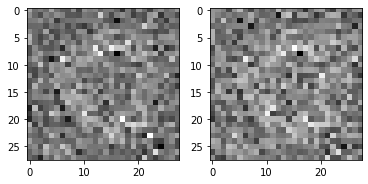

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 307200 loss: 2161.034180
batch loss value 1817.759
saving iteration * batch_size: 309760 loss: 2156.529297
time step for image 27


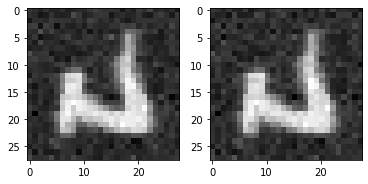

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1741.1355
saving iteration * batch_size: 312320 loss: 2155.598145
time step for image 18


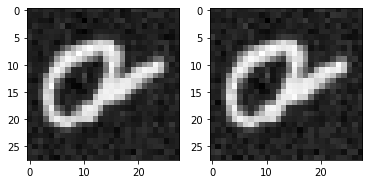

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1867.9414
saving iteration * batch_size: 314880 loss: 2144.565186
time step for image 134


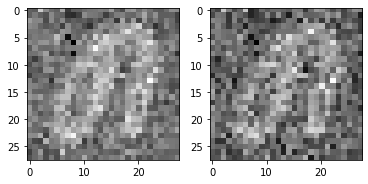

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1861.5326
batch loss value 1676.9441
saving iteration * batch_size: 320000 loss: 2138.127686
time step for image 116


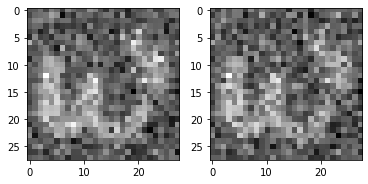

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 2015.8275
batch loss value 1765.8579
saving iteration * batch_size: 325120 loss: 2135.108643
time step for image 72


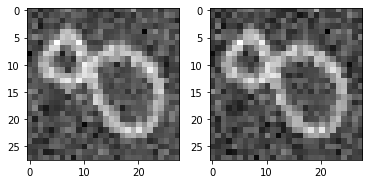

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1703.7413
saving iteration * batch_size: 327680 loss: 2129.204102
time step for image 40


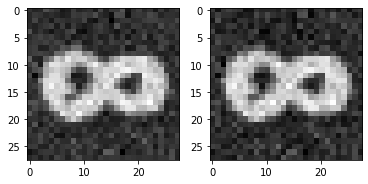

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1856.354
saving iteration * batch_size: 330240 loss: 2122.839355
time step for image 61


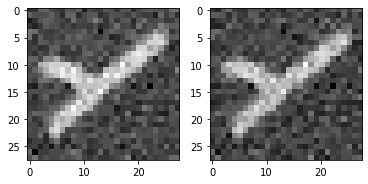

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1716.6086
saving iteration * batch_size: 332800 loss: 2114.398438
time step for image 123


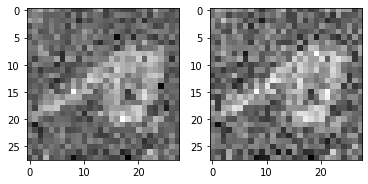

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 332800 loss: 2114.398438
batch loss value 1814.2517
saving iteration * batch_size: 335360 loss: 2108.260254
time step for image 39


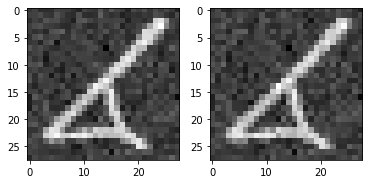

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1763.0303
saving iteration * batch_size: 337920 loss: 2102.725586
time step for image 132


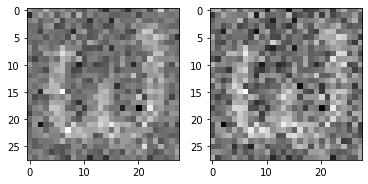

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1853.2218
saving iteration * batch_size: 340480 loss: 2098.575684
time step for image 28


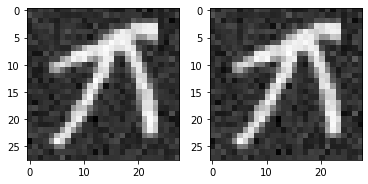

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1712.5074
saving iteration * batch_size: 343040 loss: 2095.861328
time step for image 125


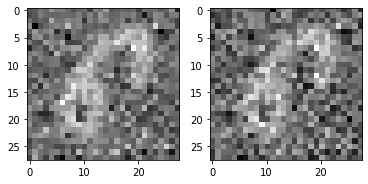

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1833.8942
batch loss value 1855.9236
saving iteration * batch_size: 348160 loss: 2081.656494
time step for image 127


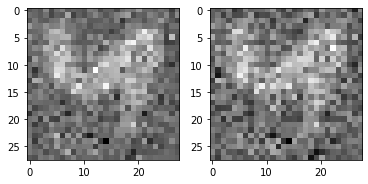

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1716.3455
saving iteration * batch_size: 350720 loss: 2073.189697
time step for image 4


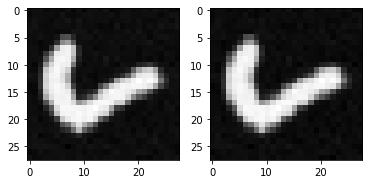

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1665.2896
batch loss value 1776.9875
batch loss value 1650.3918
iteration * batch_size: 358400 loss: 2078.679688
batch loss value 1783.4331
batch loss value 1830.628
saving iteration * batch_size: 363520 loss: 2064.679199
time step for image 44


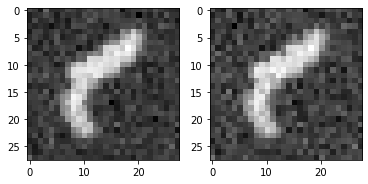

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1600.8445
saving iteration * batch_size: 366080 loss: 2062.998779
time step for image 31


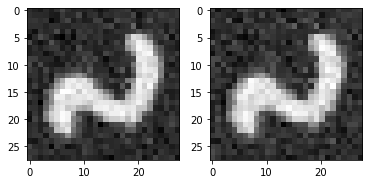

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1727.4001
saving iteration * batch_size: 368640 loss: 2055.460938
time step for image 3


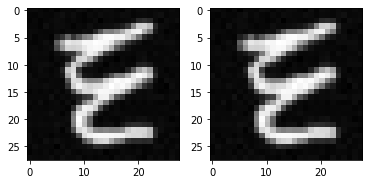

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1701.4861
saving iteration * batch_size: 371200 loss: 2051.210938
time step for image 30


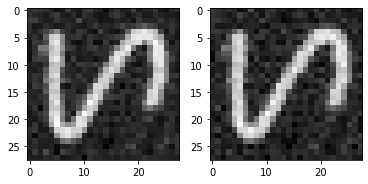

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1754.1052
batch loss value 1813.2063
saving iteration * batch_size: 376320 loss: 2040.900146
time step for image 179


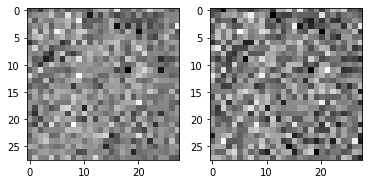

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1878.0398
batch loss value 1786.4851
saving iteration * batch_size: 381440 loss: 2040.613525
time step for image 165


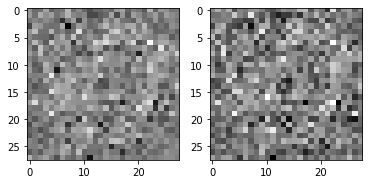

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1706.6941
saving iteration * batch_size: 384000 loss: 2036.572510
time step for image 69


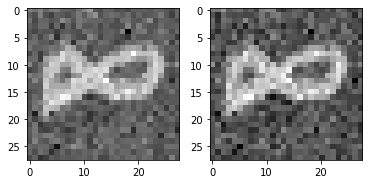

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 384000 loss: 2036.572510
batch loss value 1731.8892
saving iteration * batch_size: 386560 loss: 2031.364258
time step for image 31


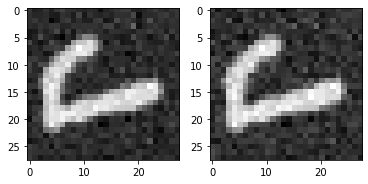

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1619.1509
saving iteration * batch_size: 389120 loss: 2029.682617
time step for image 100


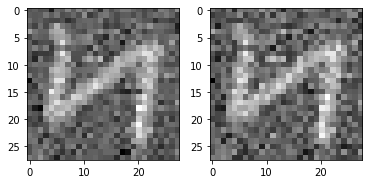

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1694.6226
saving iteration * batch_size: 391680 loss: 2019.557251
time step for image 81


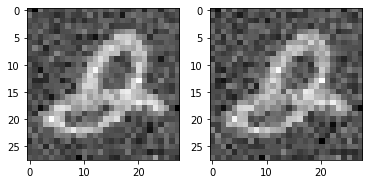

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1743.219
batch loss value 1856.7979
batch loss value 1656.7859
batch loss value 1755.1704
batch loss value 1865.2009
saving iteration * batch_size: 404480 loss: 2012.445312
time step for image 90


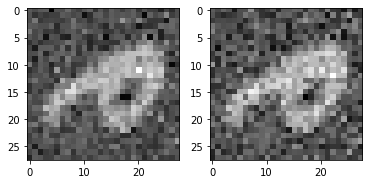

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1808.4008
saving iteration * batch_size: 407040 loss: 2010.611084
time step for image 40


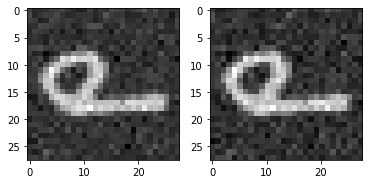

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1653.6759
iteration * batch_size: 409600 loss: 2010.995117
batch loss value 1762.258
saving iteration * batch_size: 412160 loss: 1999.351318
time step for image 8


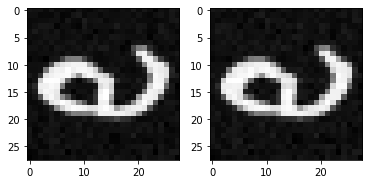

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1672.8135
saving iteration * batch_size: 414720 loss: 1994.152710
time step for image 31


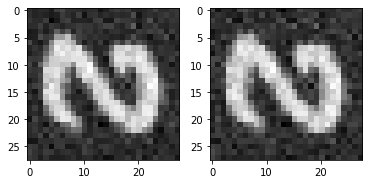

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1926.2944
saving iteration * batch_size: 417280 loss: 1991.956787
time step for image 117


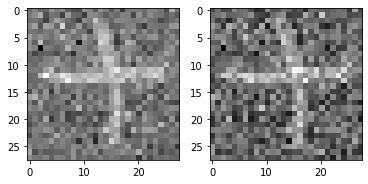

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1752.8275
batch loss value 1679.896
saving iteration * batch_size: 422400 loss: 1981.642090
time step for image 91


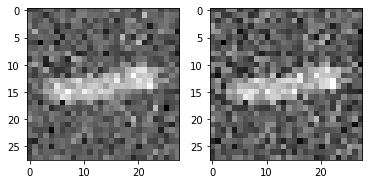

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1692.9534
saving iteration * batch_size: 424960 loss: 1977.132324
time step for image 35


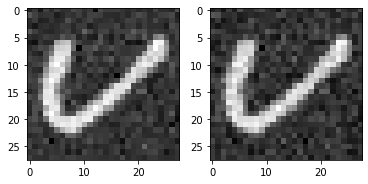

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1695.5784
batch loss value 1614.3005
batch loss value 1752.8655
batch loss value 1703.9268
iteration * batch_size: 435200 loss: 1978.519409
batch loss value 1822.6711
saving iteration * batch_size: 437760 loss: 1967.584595
time step for image 136


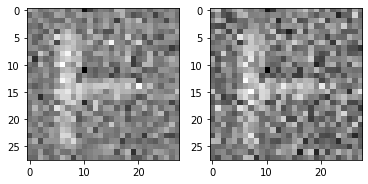

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1656.8458
saving iteration * batch_size: 440320 loss: 1963.609863
time step for image 41


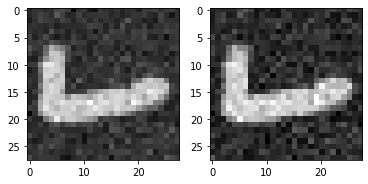

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1706.0444
saving iteration * batch_size: 442880 loss: 1961.740723
time step for image 55


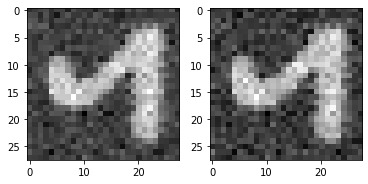

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1823.1708
saving iteration * batch_size: 445440 loss: 1961.683228
time step for image 11


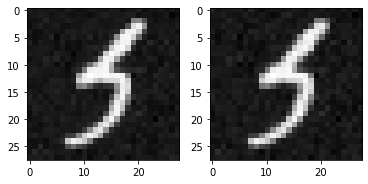

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1707.0818
saving iteration * batch_size: 448000 loss: 1950.226562
time step for image 197


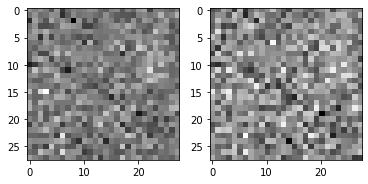

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1552.1226
batch loss value 1714.1643
batch loss value 1730.6666
batch loss value 1752.8806
batch loss value 1711.0155
iteration * batch_size: 460800 loss: 1952.374268
batch loss value 1610.0339
saving iteration * batch_size: 463360 loss: 1949.504150
time step for image 151


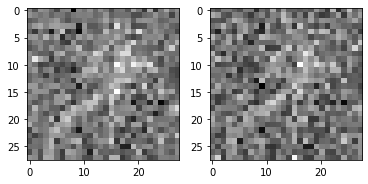

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1479.2352
saving iteration * batch_size: 465920 loss: 1931.526367
time step for image 148


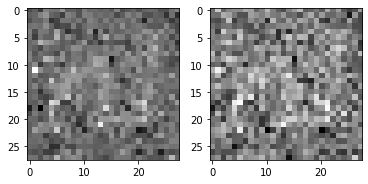

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1749.2389
batch loss value 1556.9039
batch loss value 1652.9465
batch loss value 1540.8708
batch loss value 1784.4431
batch loss value 1681.014
batch loss value 1681.0654
batch loss value 1744.5232
saving iteration * batch_size: 486400 loss: 1924.383789
time step for image 37


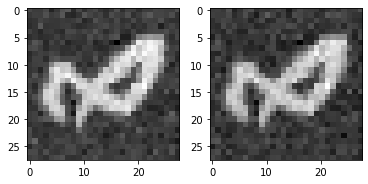

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 486400 loss: 1924.383789
batch loss value 1665.9211
saving iteration * batch_size: 488960 loss: 1915.973267
time step for image 40


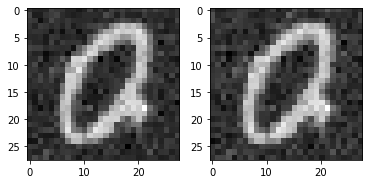

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1667.7723
batch loss value 1604.6423
saving iteration * batch_size: 494080 loss: 1908.861572
time step for image 141


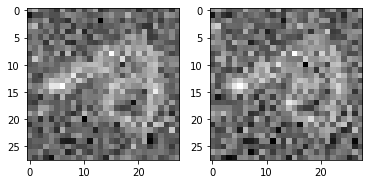

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1664.9232
batch loss value 1695.225
saving iteration * batch_size: 499200 loss: 1906.880615
time step for image 151


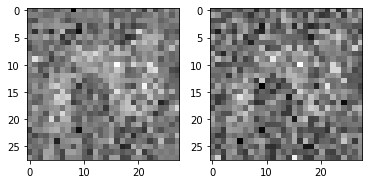

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1561.8281
batch loss value 1570.6216
batch loss value 1618.967
saving iteration * batch_size: 506880 loss: 1904.136719
time step for image 153


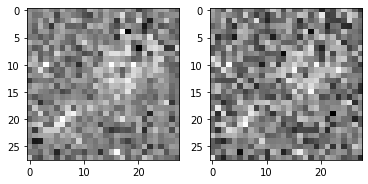

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1640.3132
batch loss value 1758.6282
saving iteration * batch_size: 512000 loss: 1901.911499
time step for image 11


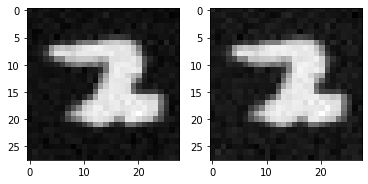

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 512000 loss: 1901.911499
batch loss value 1634.6257
batch loss value 1669.4198
saving iteration * batch_size: 517120 loss: 1897.531250
time step for image 161


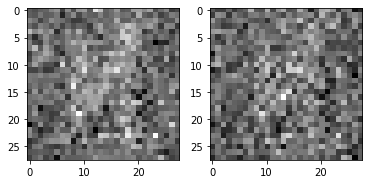

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1684.9265
batch loss value 1624.8259
saving iteration * batch_size: 522240 loss: 1887.220215
time step for image 82


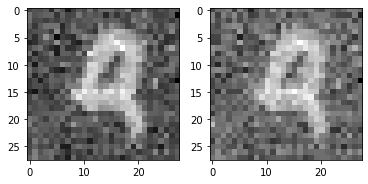

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1742.7354
saving iteration * batch_size: 524800 loss: 1881.200195
time step for image 7


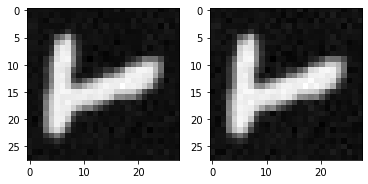

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1661.8588
batch loss value 1695.5044
batch loss value 1611.4333
batch loss value 1549.3462
batch loss value 1664.8066
iteration * batch_size: 537600 loss: 1899.225342
batch loss value 1569.5874
batch loss value 1645.3469
saving iteration * batch_size: 542720 loss: 1875.665283
time step for image 154


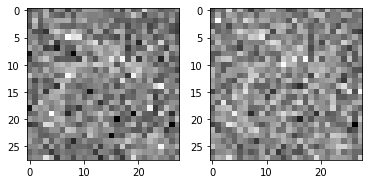

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1660.3479
saving iteration * batch_size: 545280 loss: 1864.120972
time step for image 18


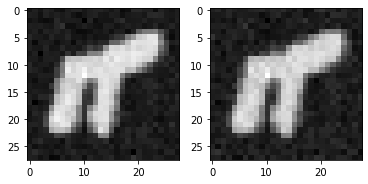

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1538.2858
saving iteration * batch_size: 547840 loss: 1863.674683
time step for image 2


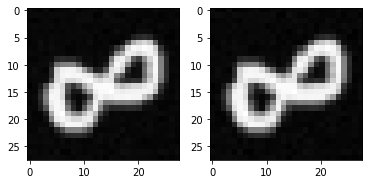

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1671.6108
saving iteration * batch_size: 550400 loss: 1863.655273
time step for image 146


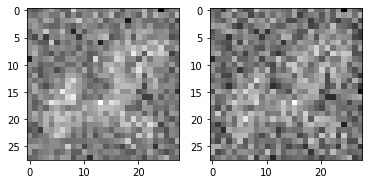

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1626.743
saving iteration * batch_size: 552960 loss: 1856.753906
time step for image 34


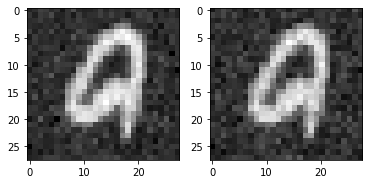

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1517.9336
batch loss value 1649.7574
batch loss value 1648.9025
batch loss value 1671.4999
iteration * batch_size: 563200 loss: 1864.720703
batch loss value 1629.2737
saving iteration * batch_size: 565760 loss: 1856.178589
time step for image 28


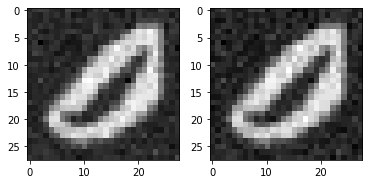

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1663.802
batch loss value 1697.8835
saving iteration * batch_size: 570880 loss: 1841.577637
time step for image 191


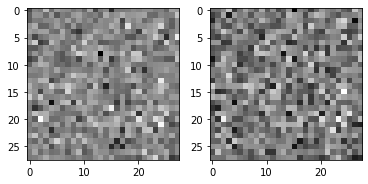

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1598.5818
batch loss value 1617.6989
saving iteration * batch_size: 576000 loss: 1839.164307
time step for image 32


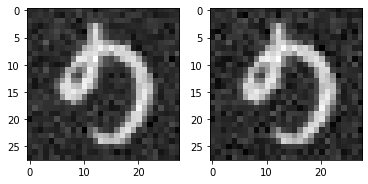

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1493.9274
batch loss value 1570.8723
batch loss value 1449.9296
saving iteration * batch_size: 583680 loss: 1835.438110
time step for image 101


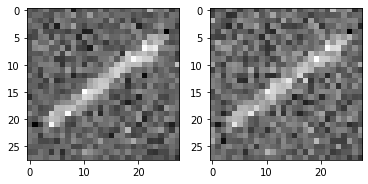

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1621.8871
batch loss value 1642.7872
iteration * batch_size: 588800 loss: 1849.147949
batch loss value 1448.3728
batch loss value 1538.0394
saving iteration * batch_size: 593920 loss: 1829.166016
time step for image 90


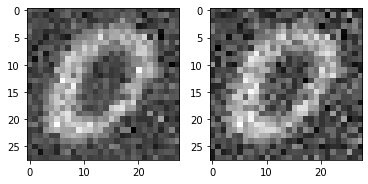

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1505.0139
batch loss value 1579.8289
batch loss value 1525.3217
batch loss value 1628.0083
batch loss value 1494.4868
batch loss value 1618.2576
batch loss value 1618.7236
saving iteration * batch_size: 611840 loss: 1825.162964
time step for image 185


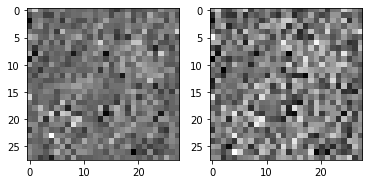

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1569.1763
iteration * batch_size: 614400 loss: 1828.270508
batch loss value 1628.9932
saving iteration * batch_size: 616960 loss: 1824.469971
time step for image 85


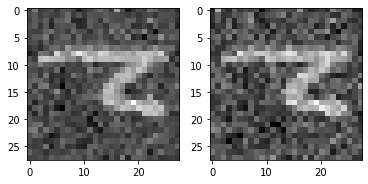

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1572.9207
batch loss value 1611.9307
batch loss value 1473.7345
batch loss value 1549.5542
batch loss value 1471.1077
saving iteration * batch_size: 629760 loss: 1818.942383
time step for image 90


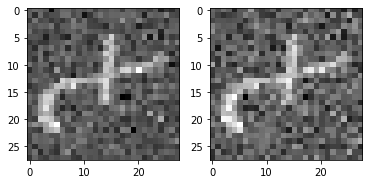

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1469.7947
saving iteration * batch_size: 632320 loss: 1816.525757
time step for image 30


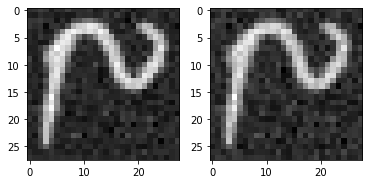

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1423.3728
saving iteration * batch_size: 634880 loss: 1811.030151
time step for image 52


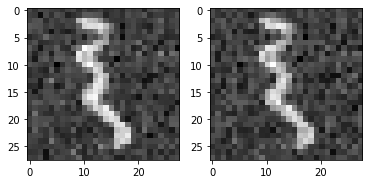

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1767.0479
batch loss value 1660.6199
iteration * batch_size: 640000 loss: 1823.464600
batch loss value 1741.7228
batch loss value 1404.126
saving iteration * batch_size: 645120 loss: 1810.377197
time step for image 97


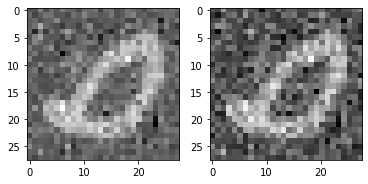

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1605.5215
batch loss value 1729.6111
batch loss value 1509.0765
batch loss value 1411.8307
saving iteration * batch_size: 655360 loss: 1800.380371
time step for image 12


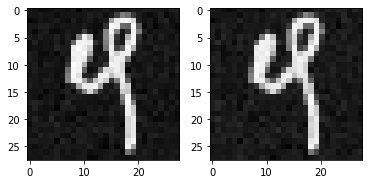

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1559.0879
batch loss value 1737.9155
batch loss value 1439.6089
batch loss value 1391.1825
saving iteration * batch_size: 665600 loss: 1797.694458
time step for image 120


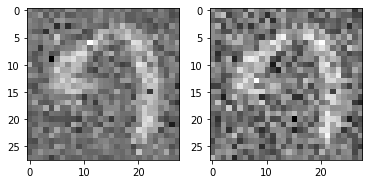

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 665600 loss: 1797.694458
batch loss value 1354.9446
saving iteration * batch_size: 668160 loss: 1793.852173
time step for image 183


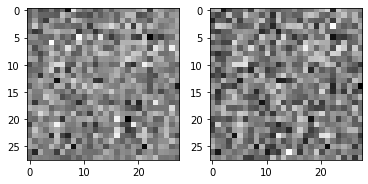

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1437.3237
saving iteration * batch_size: 670720 loss: 1793.281982
time step for image 189


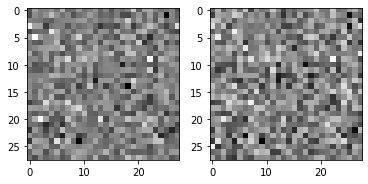

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1642.8252
batch loss value 1612.1265
batch loss value 1489.1472
batch loss value 1653.1716
batch loss value 1450.1528
saving iteration * batch_size: 683520 loss: 1784.994019
time step for image 142


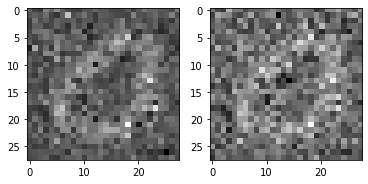

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1482.8872
batch loss value 1494.8022
saving iteration * batch_size: 688640 loss: 1783.841919
time step for image 15


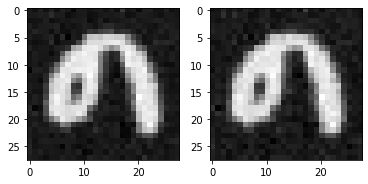

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1488.9916
iteration * batch_size: 691200 loss: 1785.405762
batch loss value 1574.5483
saving iteration * batch_size: 693760 loss: 1775.488159
time step for image 71


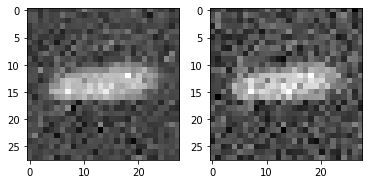

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1454.9321
batch loss value 1569.0349
batch loss value 1576.5322
batch loss value 1530.2986
batch loss value 1497.9972
batch loss value 1541.2374
batch loss value 1445.1365
saving iteration * batch_size: 711680 loss: 1775.251831
time step for image 32


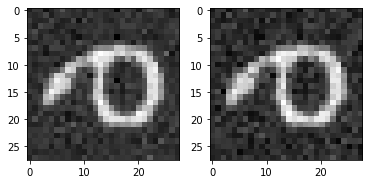

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1551.9048
saving iteration * batch_size: 714240 loss: 1774.661011
time step for image 167


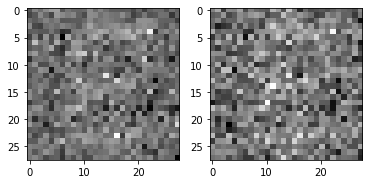

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1495.3193
iteration * batch_size: 716800 loss: 1786.256104
batch loss value 1571.8226
batch loss value 1429.3789
saving iteration * batch_size: 721920 loss: 1772.453003
time step for image 106


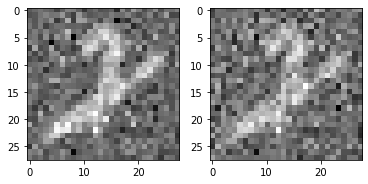

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1517.6222
saving iteration * batch_size: 724480 loss: 1758.881104
time step for image 22


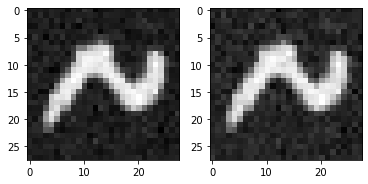

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1565.9076
batch loss value 1453.4502
batch loss value 1525.3201
batch loss value 1591.6865
batch loss value 1672.2197
batch loss value 1428.117
batch loss value 1519.5151
iteration * batch_size: 742400 loss: 1762.558228
batch loss value 1443.6254
saving iteration * batch_size: 744960 loss: 1756.074463
time step for image 54


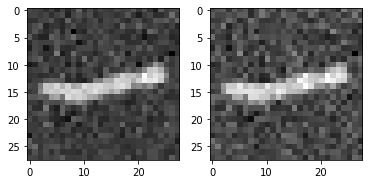

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1776.7673
saving iteration * batch_size: 747520 loss: 1755.621826
time step for image 64


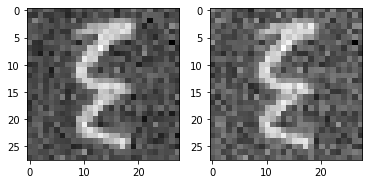

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1357.7477
batch loss value 1397.9888
batch loss value 1399.7286
saving iteration * batch_size: 755200 loss: 1749.314697
time step for image 26


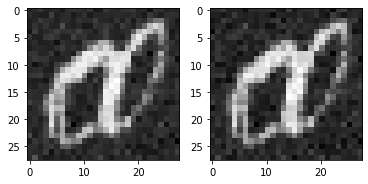

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1572.7073
saving iteration * batch_size: 757760 loss: 1747.795410
time step for image 4


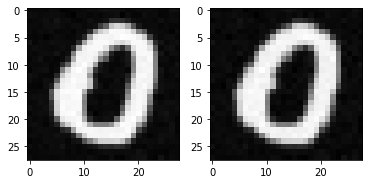

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1487.3291
batch loss value 1453.124
batch loss value 1457.0258
saving iteration * batch_size: 765440 loss: 1743.324097
time step for image 94


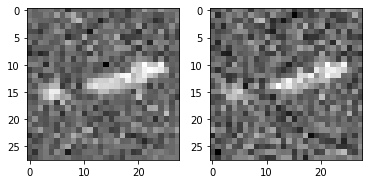

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1566.7002
iteration * batch_size: 768000 loss: 1771.145996
batch loss value 1449.663
batch loss value 1624.5695
batch loss value 1663.3315
batch loss value 1387.407
batch loss value 1455.125
saving iteration * batch_size: 780800 loss: 1733.927002
time step for image 79


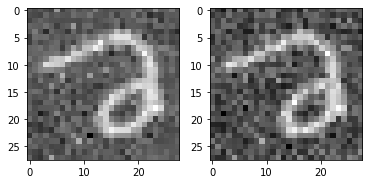

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1492.5503
batch loss value 1421.2991
batch loss value 1503.2399
batch loss value 1541.9797
batch loss value 1558.0962
iteration * batch_size: 793600 loss: 1748.883911
batch loss value 1474.1467
batch loss value 1556.513
batch loss value 1521.7421
batch loss value 1380.7451
saving iteration * batch_size: 803840 loss: 1726.916870
time step for image 66


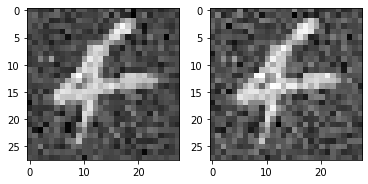

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1568.8125
batch loss value 1377.9563
batch loss value 1656.9673
batch loss value 1440.2203
saving iteration * batch_size: 814080 loss: 1726.914551
time step for image 181


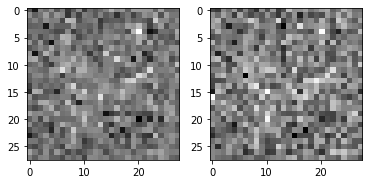

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1356.1877
batch loss value 1550.2152
saving iteration * batch_size: 819200 loss: 1725.689209
time step for image 10


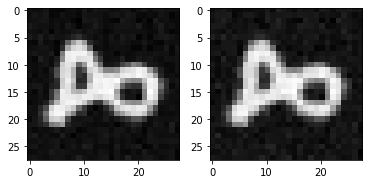

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 819200 loss: 1725.689209
batch loss value 1471.2228
saving iteration * batch_size: 821760 loss: 1722.428223
time step for image 135


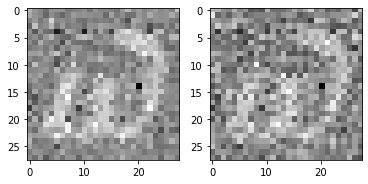

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1488.9695
batch loss value 1502.3457
batch loss value 1543.0173
batch loss value 1431.1716
batch loss value 1380.051
batch loss value 1381.417
batch loss value 1491.3953
saving iteration * batch_size: 839680 loss: 1713.687866
time step for image 131


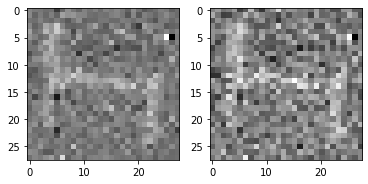

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1396.2227
batch loss value 1570.9174
saving iteration * batch_size: 844800 loss: 1706.069336
time step for image 78


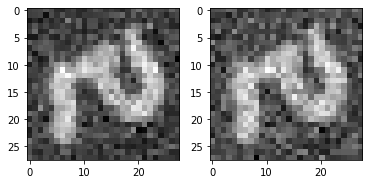

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 844800 loss: 1706.069336
batch loss value 1530.6843
batch loss value 1556.9691
batch loss value 1530.7473
batch loss value 1640.0629
batch loss value 1447.6228
batch loss value 1309.1565
batch loss value 1449.7173
saving iteration * batch_size: 862720 loss: 1695.231812
time step for image 199


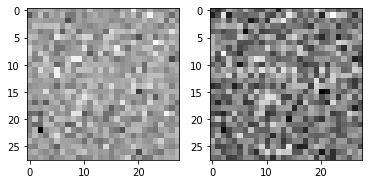

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1376.0779
batch loss value 1406.01
batch loss value 1420.8348
iteration * batch_size: 870400 loss: 1701.710205
batch loss value 1465.4657
batch loss value 1451.1074
batch loss value 1506.0073
batch loss value 1439.5278
batch loss value 1609.1416
saving iteration * batch_size: 883200 loss: 1690.622070
time step for image 120


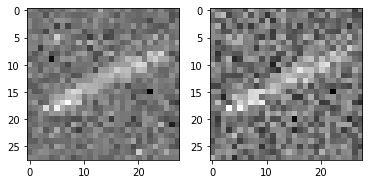

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1376.8872
batch loss value 1346.5039
batch loss value 1400.1543
batch loss value 1516.1826
batch loss value 1535.7269
iteration * batch_size: 896000 loss: 1715.680908
batch loss value 1402.3722
batch loss value 1409.5662
batch loss value 1520.4507
saving iteration * batch_size: 903680 loss: 1689.895508
time step for image 11


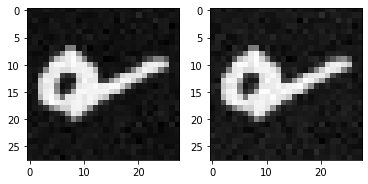

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1456.9812
batch loss value 1472.2517
batch loss value 1428.5745
saving iteration * batch_size: 911360 loss: 1689.236084
time step for image 139


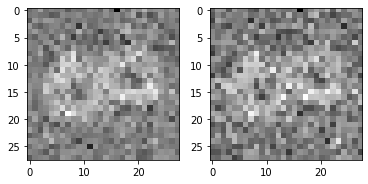

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1506.5293
batch loss value 1303.8667
batch loss value 1425.6316
saving iteration * batch_size: 919040 loss: 1688.935181
time step for image 137


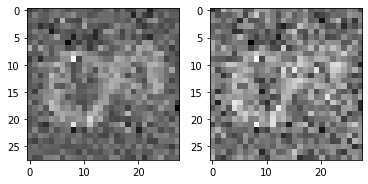

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1505.244
iteration * batch_size: 921600 loss: 1695.621826
batch loss value 1512.9186
saving iteration * batch_size: 924160 loss: 1685.218750
time step for image 7


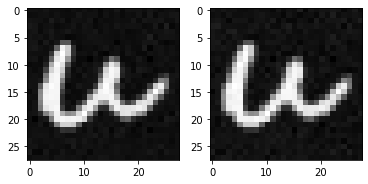

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1282.9863
saving iteration * batch_size: 926720 loss: 1683.828369
time step for image 89


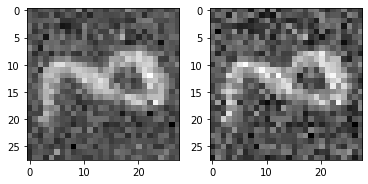

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1383.8352
saving iteration * batch_size: 929280 loss: 1677.227051
time step for image 34


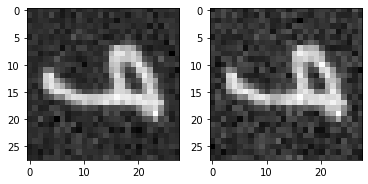

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1439.1974
saving iteration * batch_size: 931840 loss: 1671.531494
time step for image 182


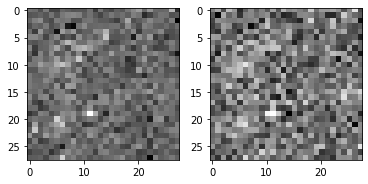

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1575.2856
batch loss value 1471.268
batch loss value 1313.8884
batch loss value 1533.736
saving iteration * batch_size: 942080 loss: 1667.338135
time step for image 94


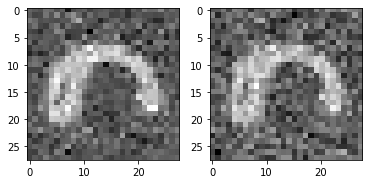

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1378.7147
batch loss value 1455.8901
iteration * batch_size: 947200 loss: 1670.444824
batch loss value 1575.8752
batch loss value 1330.39
saving iteration * batch_size: 952320 loss: 1657.737915
time step for image 79


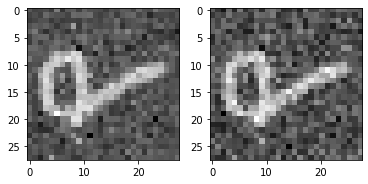

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1419.5612
batch loss value 1509.4731
batch loss value 1360.2302
batch loss value 1346.9698
batch loss value 1454.287
batch loss value 1298.1462
batch loss value 1382.4847
batch loss value 1409.8986
iteration * batch_size: 972800 loss: 1671.376221
batch loss value 1366.5278
batch loss value 1428.7
batch loss value 1444.2189
batch loss value 1455.4324
batch loss value 1472.3937
batch loss value 1453.3778
batch loss value 1426.1797
batch loss value 1470.1945
batch loss value 1530.535
batch loss value 1506.5554
iteration * batch_size: 998400 loss: 1667.386597
batch loss value 1579.4065
batch loss value 1385.0326
batch loss value 1241.238
saving iteration * batch_size: 1006080 loss: 1655.436646
time step for image 195


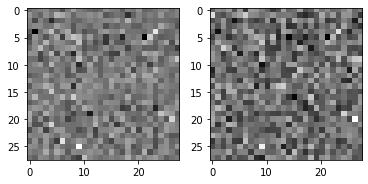

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1413.7063
batch loss value 1517.9363
batch loss value 1400.689
batch loss value 1268.4336
batch loss value 1352.7139
batch loss value 1429.4951
batch loss value 1314.6035
saving iteration * batch_size: 1024000 loss: 1632.815430
time step for image 14


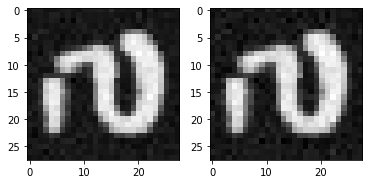

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 1024000 loss: 1632.815430
batch loss value 1436.0898
batch loss value 1362.0347
batch loss value 1500.5956
batch loss value 1339.7781
batch loss value 1482.7316
batch loss value 1524.0322
batch loss value 1321.8892
batch loss value 1410.176
batch loss value 1415.6726
batch loss value 1390.4785
iteration * batch_size: 1049600 loss: 1647.972290
batch loss value 1396.3054
batch loss value 1397.6361
saving iteration * batch_size: 1054720 loss: 1615.557129
time step for image 151


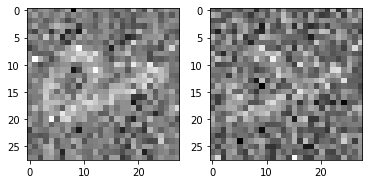

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1409.0568
batch loss value 1398.412
batch loss value 1386.9578
batch loss value 1485.6997
batch loss value 1384.2239
batch loss value 1260.1017
batch loss value 1392.4927
batch loss value 1373.3624
iteration * batch_size: 1075200 loss: 1654.132324
batch loss value 1493.8164
batch loss value 1341.3506
batch loss value 1459.476
batch loss value 1356.7402
batch loss value 1398.0033
batch loss value 1413.5571
batch loss value 1434.2559
batch loss value 1386.7473
batch loss value 1302.8662
batch loss value 1425.6746
iteration * batch_size: 1100800 loss: 1655.379883
batch loss value 1423.1365
batch loss value 1406.0045
batch loss value 1350.8389
batch loss value 1310.6
batch loss value 1437.6338
batch loss value 1273.4604
batch loss value 1408.5957
batch loss value 1518.7385
batch loss value 1456.6205
batch loss value 1323.9731
iteration * batch_size: 1126400 loss: 1643.759521
batch loss value 1351.7833
batch loss value 1587.6913
batch loss value 1352.3478
batch loss value 1

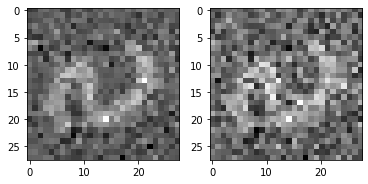

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1290.7466
batch loss value 1421.6272
batch loss value 1431.699
saving iteration * batch_size: 1149440 loss: 1605.977173
time step for image 21


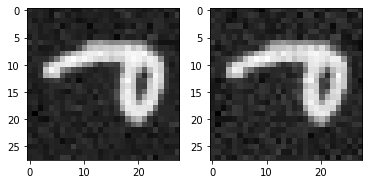

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1365.2078
iteration * batch_size: 1152000 loss: 1622.331421
batch loss value 1428.179
batch loss value 1470.1987
batch loss value 1376.2455
batch loss value 1299.6829
batch loss value 1234.7017
batch loss value 1547.0132
batch loss value 1497.3704
batch loss value 1364.5068
batch loss value 1321.1912
batch loss value 1339.8922
saving iteration * batch_size: 1177600 loss: 1601.106689
time step for image 148


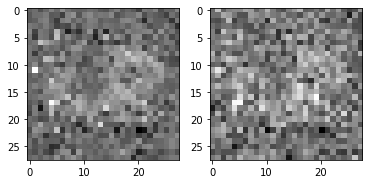

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 1177600 loss: 1601.106689
batch loss value 1557.5151
batch loss value 1425.8513
saving iteration * batch_size: 1182720 loss: 1599.405518
time step for image 40


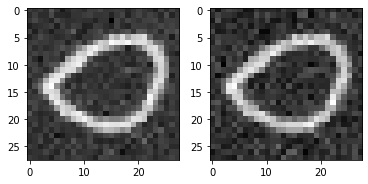

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1385.5465
batch loss value 1438.1477
batch loss value 1357.552
batch loss value 1455.0718
batch loss value 1198.0999
batch loss value 1372.7828
saving iteration * batch_size: 1198080 loss: 1599.051025
time step for image 87


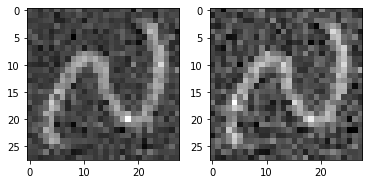

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1338.6709
batch loss value 1259.4192
iteration * batch_size: 1203200 loss: 1601.973389
batch loss value 1384.9575
batch loss value 1407.175
batch loss value 1518.1847
batch loss value 1368.1135
saving iteration * batch_size: 1213440 loss: 1598.575073
time step for image 42


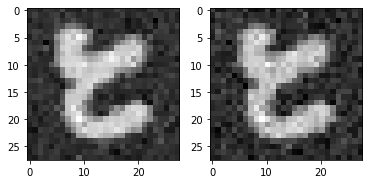

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1422.1072
batch loss value 1413.5596
batch loss value 1398.3169
batch loss value 1396.3516
batch loss value 1374.0317
batch loss value 1431.303
iteration * batch_size: 1228800 loss: 1618.244873
batch loss value 1307.8181
batch loss value 1306.0654
batch loss value 1410.014
saving iteration * batch_size: 1236480 loss: 1588.159546
time step for image 154


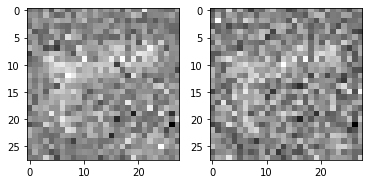

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1474.6484
batch loss value 1382.2728
batch loss value 1300.9006
batch loss value 1427.3883
batch loss value 1381.988
batch loss value 1409.8031
batch loss value 1284.6477
iteration * batch_size: 1254400 loss: 1611.150391
batch loss value 1306.7207
batch loss value 1398.8987
batch loss value 1398.0175
batch loss value 1445.9336
batch loss value 1396.9258
saving iteration * batch_size: 1267200 loss: 1586.978394
time step for image 182


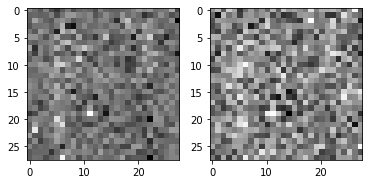

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1472.4916
batch loss value 1281.5972
batch loss value 1402.1196
saving iteration * batch_size: 1274880 loss: 1582.940674
time step for image 133


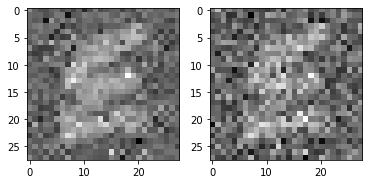

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1527.1301
batch loss value 1350.3647
iteration * batch_size: 1280000 loss: 1596.635864
batch loss value 1289.6907
batch loss value 1382.7002
batch loss value 1405.8989
batch loss value 1341.9287
saving iteration * batch_size: 1290240 loss: 1579.021240
time step for image 55


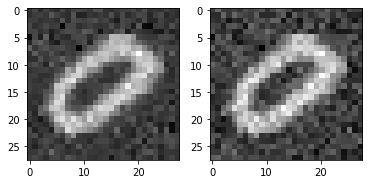

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1474.2554
batch loss value 1282.5168
batch loss value 1425.9817
batch loss value 1338.2793
batch loss value 1334.0951
batch loss value 1382.6289
iteration * batch_size: 1305600 loss: 1588.534912
batch loss value 1452.893
batch loss value 1155.8329
saving iteration * batch_size: 1310720 loss: 1568.666016
time step for image 181


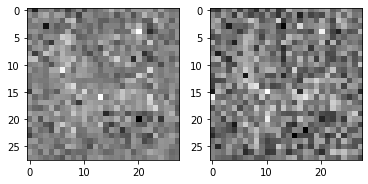

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1269.0269
batch loss value 1454.3564
batch loss value 1302.9668
batch loss value 1321.8533
batch loss value 1381.8337
batch loss value 1389.2196
batch loss value 1268.4513
batch loss value 1353.0249
iteration * batch_size: 1331200 loss: 1597.195679
batch loss value 1381.2712
batch loss value 1399.4828
batch loss value 1267.4058
batch loss value 1375.6653
batch loss value 1291.1772
batch loss value 1404.4229
batch loss value 1240.7041
saving iteration * batch_size: 1349120 loss: 1566.686035
time step for image 44


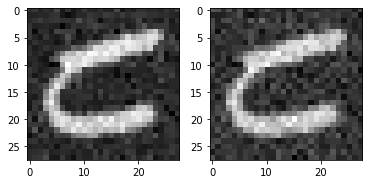

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1388.6526
batch loss value 1423.2852
batch loss value 1342.976
saving iteration * batch_size: 1356800 loss: 1558.623047
time step for image 67


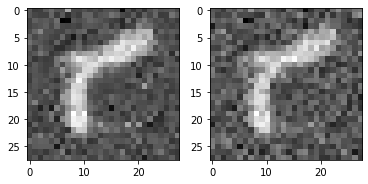

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 1356800 loss: 1558.623047
batch loss value 1373.2878
saving iteration * batch_size: 1359360 loss: 1557.561035
time step for image 125


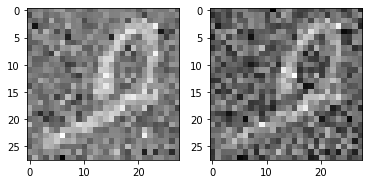

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1387.3767
batch loss value 1269.2979
batch loss value 1244.0156
batch loss value 1365.9349
batch loss value 1263.5911
batch loss value 1396.6095
batch loss value 1346.6885
batch loss value 1420.3553
batch loss value 1296.383
iteration * batch_size: 1382400 loss: 1579.093994
batch loss value 1502.6091
batch loss value 1403.9216
batch loss value 1274.7512
saving iteration * batch_size: 1390080 loss: 1554.154297
time step for image 20


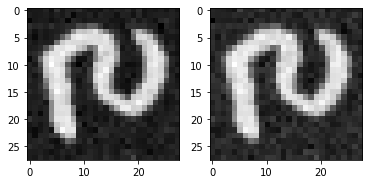

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1341.8546
batch loss value 1426.3694
batch loss value 1187.4038
batch loss value 1461.233
batch loss value 1342.4739
batch loss value 1424.71
batch loss value 1271.0431
iteration * batch_size: 1408000 loss: 1583.013062
batch loss value 1344.2145
batch loss value 1158.2264
batch loss value 1329.4258
batch loss value 1453.5938
batch loss value 1272.2471
batch loss value 1254.2474
batch loss value 1218.0565
batch loss value 1317.0957
batch loss value 1281.2676
batch loss value 1384.8123
saving iteration * batch_size: 1433600 loss: 1552.262207
time step for image 41


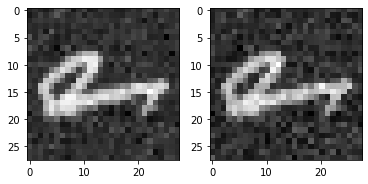

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 1433600 loss: 1552.262207
batch loss value 1268.3313
batch loss value 1392.6248
batch loss value 1335.5635
batch loss value 1234.1765
saving iteration * batch_size: 1443840 loss: 1546.222656
time step for image 139


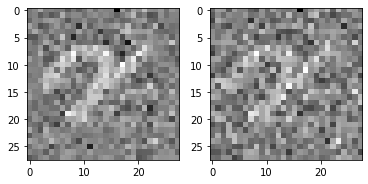

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1283.3064
batch loss value 1312.1525
saving iteration * batch_size: 1448960 loss: 1531.482910
time step for image 108


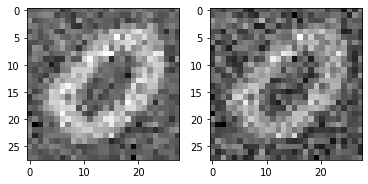

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1225.5759
batch loss value 1336.8912
batch loss value 1351.6458
batch loss value 1337.9625
iteration * batch_size: 1459200 loss: 1574.439697
batch loss value 1281.284
batch loss value 1214.8855
batch loss value 1270.7372
batch loss value 1369.3074
batch loss value 1254.581
batch loss value 1324.7786
batch loss value 1427.834
batch loss value 1390.5447
batch loss value 1313.3533
batch loss value 1509.4133
iteration * batch_size: 1484800 loss: 1567.085815
batch loss value 1328.0022
batch loss value 1426.2676
batch loss value 1222.6053
batch loss value 1484.8373
batch loss value 1241.5483
batch loss value 1400.4263
batch loss value 1218.215
batch loss value 1289.3215
batch loss value 1293.4995
batch loss value 1293.5261
iteration * batch_size: 1510400 loss: 1545.581299
batch loss value 1348.1609
batch loss value 1451.4138
saving iteration * batch_size: 1515520 loss: 1529.972900
time step for image 8


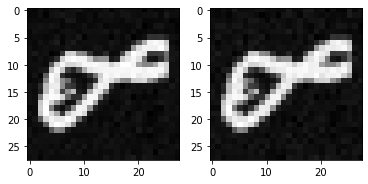

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1345.5253
batch loss value 1444.6396
batch loss value 1313.0322
batch loss value 1277.1647
batch loss value 1365.2047
saving iteration * batch_size: 1528320 loss: 1524.458740
time step for image 54


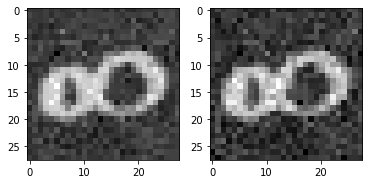

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1277.1011
batch loss value 1337.8613
batch loss value 1310.9785
iteration * batch_size: 1536000 loss: 1539.260864
batch loss value 1489.359
batch loss value 1339.9424
batch loss value 1280.6016
batch loss value 1350.8286
batch loss value 1398.8744
batch loss value 1153.5232
batch loss value 1434.037
batch loss value 1269.095
batch loss value 1269.2258
batch loss value 1167.4434
saving iteration * batch_size: 1561600 loss: 1521.219727
time step for image 160


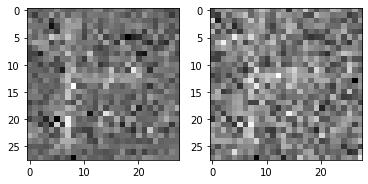

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 1561600 loss: 1521.219727
batch loss value 1349.3599
batch loss value 1298.1836
batch loss value 1326.8446
batch loss value 1439.9559
batch loss value 1332.7173
batch loss value 1367.4851
batch loss value 1289.0691
batch loss value 1470.493
batch loss value 1330.7195
saving iteration * batch_size: 1584640 loss: 1517.792480
time step for image 104


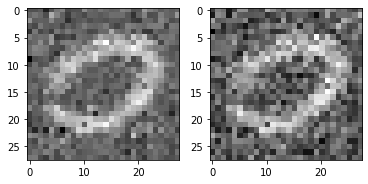

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1333.9102
iteration * batch_size: 1587200 loss: 1524.242065
batch loss value 1295.7983
batch loss value 1304.0044
batch loss value 1335.4261
saving iteration * batch_size: 1594880 loss: 1506.266846
time step for image 53


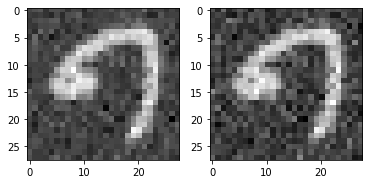

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1330.7307
batch loss value 1353.538
batch loss value 1330.4905
batch loss value 1287.4678
batch loss value 1286.1941
batch loss value 1328.5334
batch loss value 1382.1602
iteration * batch_size: 1612800 loss: 1525.307129
batch loss value 1287.0612
batch loss value 1140.7448
batch loss value 1307.2771
batch loss value 1330.9851
batch loss value 1224.2549
saving iteration * batch_size: 1625600 loss: 1498.764038
time step for image 51


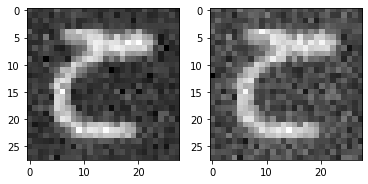

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1333.7821
batch loss value 1307.1951
batch loss value 1327.0205
batch loss value 1382.6628
batch loss value 1306.2668
iteration * batch_size: 1638400 loss: 1531.226929
batch loss value 1386.7664
batch loss value 1454.7157
batch loss value 1247.1294
batch loss value 1427.4448
batch loss value 1324.295
batch loss value 1246.8054
batch loss value 1285.2838
batch loss value 1335.3368
batch loss value 1260.408
batch loss value 1263.7578
iteration * batch_size: 1664000 loss: 1520.148804
batch loss value 1358.8203
saving iteration * batch_size: 1666560 loss: 1490.868774
time step for image 197


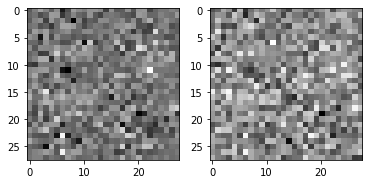

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1266.0092
batch loss value 1310.5488
batch loss value 1341.8352
batch loss value 1366.1624
batch loss value 1357.5269
batch loss value 1408.447
batch loss value 1284.4596
batch loss value 1282.5378
batch loss value 1344.0016
iteration * batch_size: 1689600 loss: 1499.367188
batch loss value 1221.081
batch loss value 1273.1089
batch loss value 1244.8632
batch loss value 1327.0342
batch loss value 1285.7915
batch loss value 1201.5635
batch loss value 1293.9694
batch loss value 1351.4419
batch loss value 1304.856
batch loss value 1332.3445
iteration * batch_size: 1715200 loss: 1512.296631
batch loss value 1236.0703
batch loss value 1220.9513
batch loss value 1312.0763
batch loss value 1301.013
batch loss value 1195.3889
batch loss value 1205.0469
batch loss value 1225.2334
batch loss value 1347.2133
batch loss value 1309.7565
batch loss value 1348.3501
iteration * batch_size: 1740800 loss: 1531.006226
batch loss value 1244.6299
batch loss value 1240.1687
batch loss value 

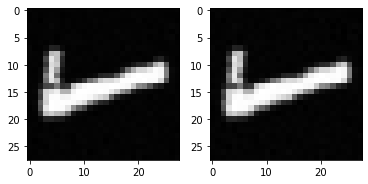

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 1792000 loss: 1483.048584
batch loss value 1338.6971
batch loss value 1313.4292
batch loss value 1306.1066
batch loss value 1306.7583
batch loss value 1243.5192
batch loss value 1191.635
batch loss value 1223.9639
batch loss value 1199.7898
batch loss value 1299.94
batch loss value 1152.5667
saving iteration * batch_size: 1817600 loss: 1478.794189
time step for image 50


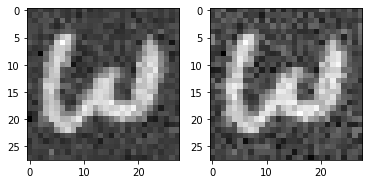

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 1817600 loss: 1478.794189
batch loss value 1212.0894
batch loss value 1418.7765
batch loss value 1325.3748
saving iteration * batch_size: 1825280 loss: 1468.237305
time step for image 32


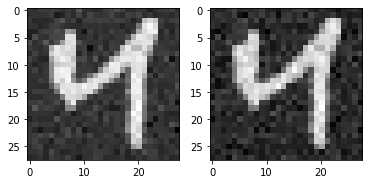

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1229.8453
batch loss value 1333.3062
batch loss value 1419.761
batch loss value 1309.9692
batch loss value 1217.9084
batch loss value 1300.1792
batch loss value 1402.6543
iteration * batch_size: 1843200 loss: 1492.084473
batch loss value 1286.4766
batch loss value 1328.4144
batch loss value 1258.5757
batch loss value 1194.0845
batch loss value 1215.0586
batch loss value 1171.9349
batch loss value 1245.6802
batch loss value 1254.249
batch loss value 1274.4397
batch loss value 1379.3602
iteration * batch_size: 1868800 loss: 1507.233154
batch loss value 1324.9172
batch loss value 1259.4133
batch loss value 1316.2861
batch loss value 1192.8408
batch loss value 1305.3088
batch loss value 1444.8478
batch loss value 1406.0394
batch loss value 1211.9219
batch loss value 1258.1136
batch loss value 1187.5095
iteration * batch_size: 1894400 loss: 1484.698853
batch loss value 1390.9182
batch loss value 1202.556
batch loss value 1284.4954
saving iteration * batch_size: 1902080 loss

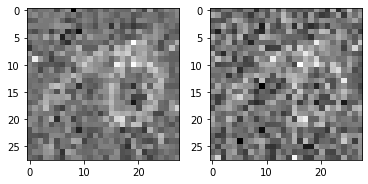

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1255.8093
batch loss value 1286.2283
batch loss value 1319.2422
saving iteration * batch_size: 1909760 loss: 1463.125244
time step for image 81


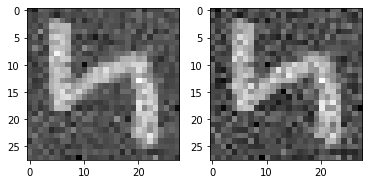

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1265.4629
batch loss value 1330.2655
batch loss value 1261.3053
batch loss value 1199.356
iteration * batch_size: 1920000 loss: 1512.118896
batch loss value 1196.935
batch loss value 1428.6619
batch loss value 1247.0881
batch loss value 1249.3309
batch loss value 1382.5454
batch loss value 1284.3215
batch loss value 1139.3517
batch loss value 1252.4924
batch loss value 1398.9839
batch loss value 1253.3357
iteration * batch_size: 1945600 loss: 1466.102051
batch loss value 1376.148
batch loss value 1254.3135
batch loss value 1286.2799
batch loss value 1344.9932
batch loss value 1271.5547
batch loss value 1340.3545
batch loss value 1450.7899
batch loss value 1365.6677
batch loss value 1103.2458
batch loss value 1171.5629
iteration * batch_size: 1971200 loss: 1471.717773
batch loss value 1345.7534
batch loss value 1171.2744
batch loss value 1271.9426
batch loss value 1117.0161
batch loss value 1269.0201
batch loss value 1276.7317
batch loss value 1215.5583
batch loss value

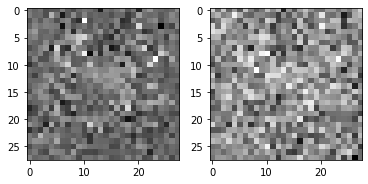

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1367.7578
batch loss value 1212.367
iteration * batch_size: 1996800 loss: 1468.622070
batch loss value 1268.5076
batch loss value 1261.8215
saving iteration * batch_size: 2001920 loss: 1461.255615
time step for image 184


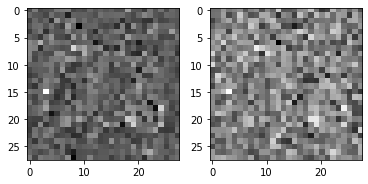

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1151.9095
saving iteration * batch_size: 2004480 loss: 1458.474609
time step for image 0


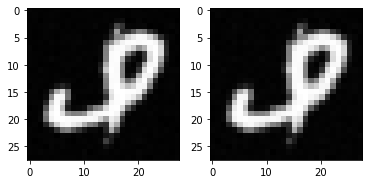

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1314.6946
batch loss value 1236.753
batch loss value 1303.3372
batch loss value 1230.2356
batch loss value 1261.8202
batch loss value 1298.0618
batch loss value 1290.6383
iteration * batch_size: 2022400 loss: 1482.358398
batch loss value 1290.4857
batch loss value 1283.1609
batch loss value 1200.5657
batch loss value 1353.2786
saving iteration * batch_size: 2032640 loss: 1457.871582
time step for image 32


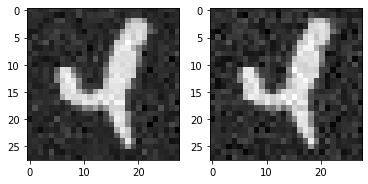

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1215.766
batch loss value 1287.811
saving iteration * batch_size: 2037760 loss: 1457.157593
time step for image 90


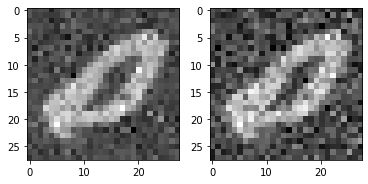

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1165.8506
batch loss value 1287.7288
batch loss value 1323.2605
batch loss value 1306.3606
iteration * batch_size: 2048000 loss: 1469.356934
batch loss value 1221.6375
saving iteration * batch_size: 2050560 loss: 1454.664795
time step for image 93


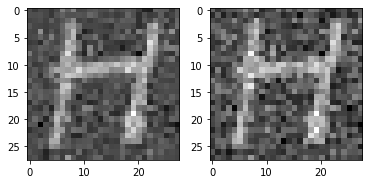

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1293.917
batch loss value 1182.3553
batch loss value 1207.9304
batch loss value 1193.5154
batch loss value 1271.7588
saving iteration * batch_size: 2063360 loss: 1451.274536
time step for image 3


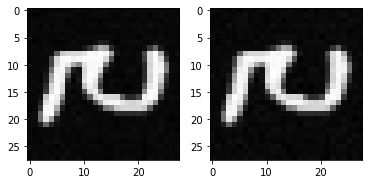

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1187.5396
batch loss value 1314.6038
batch loss value 1117.0735
batch loss value 1200.9714
iteration * batch_size: 2073600 loss: 1456.430054
batch loss value 1443.2283
batch loss value 1197.1704
batch loss value 1193.029
saving iteration * batch_size: 2081280 loss: 1433.489014
time step for image 59


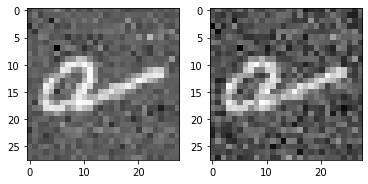

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1204.366
batch loss value 1279.613
batch loss value 1306.6116
batch loss value 1249.0377
batch loss value 1251.2468
batch loss value 1314.5396
batch loss value 1407.1155
iteration * batch_size: 2099200 loss: 1461.434814
batch loss value 1157.6484
batch loss value 1250.2446
batch loss value 1217.6442
batch loss value 1142.1135
batch loss value 1344.1012
batch loss value 1387.604
batch loss value 1448.2693
batch loss value 1326.8073
batch loss value 1206.849
batch loss value 1272.5735
iteration * batch_size: 2124800 loss: 1462.550537
batch loss value 1219.7993
batch loss value 1305.0964
batch loss value 1222.0312
batch loss value 1319.4055
batch loss value 1197.9615
batch loss value 1241.4751
batch loss value 1151.4073
batch loss value 1212.3722
batch loss value 1104.5034
batch loss value 1254.8118
iteration * batch_size: 2150400 loss: 1449.689087
batch loss value 1279.7424
batch loss value 1281.6199
batch loss value 1279.4578
batch loss value 1287.4004
batch loss value 

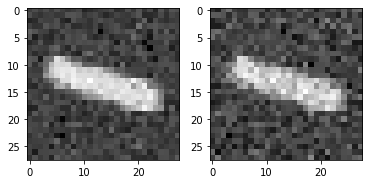

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 2201600 loss: 1422.210205
batch loss value 1185.849
batch loss value 1114.8555
batch loss value 1210.8381
batch loss value 1255.468
batch loss value 1307.1345
batch loss value 1275.6543
batch loss value 1265.3358
batch loss value 1197.3087
batch loss value 1339.3105
batch loss value 1203.26
iteration * batch_size: 2227200 loss: 1438.488525
batch loss value 1168.8713
batch loss value 1286.4937
batch loss value 1116.5283
batch loss value 1237.7925
batch loss value 1197.8063
batch loss value 1236.9836
batch loss value 1216.6433
batch loss value 1160.45
batch loss value 1236.845
batch loss value 1220.7029
iteration * batch_size: 2252800 loss: 1457.371338
batch loss value 1262.5537
batch loss value 1365.2148
batch loss value 1271.791
batch loss value 1237.7211
batch loss value 1266.497
batch loss value 1299.15
batch loss value 1207.4623
batch loss value 1207.8851
batch loss value 1196.4535
batch loss value 1140.848
iteration * batch_size: 2278400 loss: 1439.643555
ba

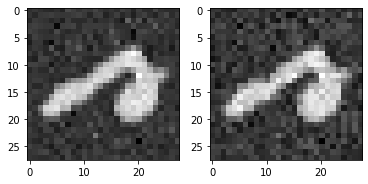

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration * batch_size: 2329600 loss: 1418.204346
batch loss value 1262.3474
batch loss value 1213.8885
batch loss value 1135.5164
batch loss value 1270.917
batch loss value 1232.72
saving iteration * batch_size: 2342400 loss: 1415.503784
time step for image 28


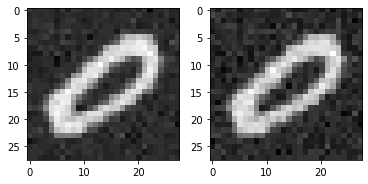

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1237.5078
batch loss value 1123.9846
batch loss value 1145.6154
batch loss value 1355.7322
batch loss value 1207.0437
iteration * batch_size: 2355200 loss: 1428.955811
batch loss value 1171.9768
batch loss value 1235.991
batch loss value 1334.2578
batch loss value 1282.8276
batch loss value 1221.2196
batch loss value 1181.892
batch loss value 1185.2546
batch loss value 1229.2455
batch loss value 1326.5504
saving iteration * batch_size: 2378240 loss: 1412.416016
time step for image 67


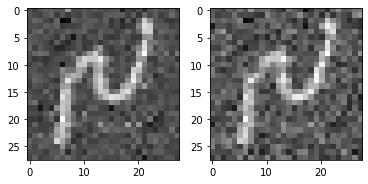

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1172.7454
iteration * batch_size: 2380800 loss: 1423.707642
batch loss value 1326.615
batch loss value 1321.6559
batch loss value 1191.6564
batch loss value 1223.0793
batch loss value 1367.0265
batch loss value 1287.7256
batch loss value 1071.4023
batch loss value 1187.4512
batch loss value 1114.4347
batch loss value 1211.8071
iteration * batch_size: 2406400 loss: 1439.388916
batch loss value 1262.072
batch loss value 1135.724
batch loss value 1229.2861
batch loss value 1251.1436
batch loss value 1204.2603
batch loss value 1107.3497
batch loss value 1323.2627
batch loss value 1141.7102
batch loss value 1345.2987
batch loss value 1244.5624
iteration * batch_size: 2432000 loss: 1430.197510
batch loss value 1196.9926
saving iteration * batch_size: 2434560 loss: 1405.085571
time step for image 173


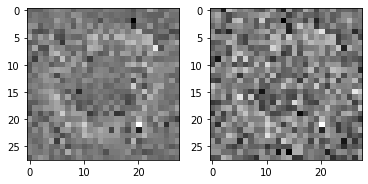

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1171.7803
batch loss value 1243.0018
batch loss value 1145.7661
batch loss value 1333.9348
batch loss value 1245.2723
batch loss value 1138.9462
batch loss value 1151.6931
batch loss value 1256.0042
batch loss value 1175.6067
iteration * batch_size: 2457600 loss: 1413.706787
batch loss value 1261.0535
batch loss value 1209.7488
saving iteration * batch_size: 2462720 loss: 1395.296143
time step for image 57


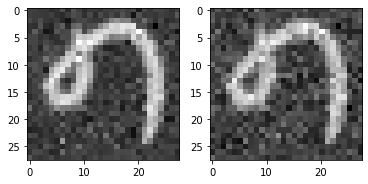

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1354.4536
batch loss value 1142.1145
batch loss value 1190.5852
batch loss value 1062.1622
batch loss value 1131.6571
batch loss value 1266.959
batch loss value 1367.5734
batch loss value 1091.5627
iteration * batch_size: 2483200 loss: 1437.813232
batch loss value 1230.0126
batch loss value 1161.5205
batch loss value 1178.5017
batch loss value 1145.0895
batch loss value 1255.5726
batch loss value 1139.9326
batch loss value 1285.8425
batch loss value 1177.8103
batch loss value 1173.8857
saving iteration * batch_size: 2506240 loss: 1390.772095
time step for image 3


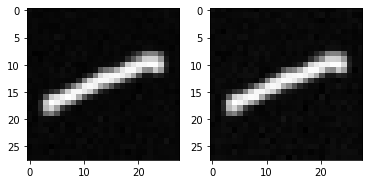

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1232.3347
iteration * batch_size: 2508800 loss: 1400.587646
batch loss value 1144.9022
batch loss value 1215.1824
batch loss value 1259.6929
batch loss value 1124.619
batch loss value 1238.9895
batch loss value 1196.6807
batch loss value 1236.9988
batch loss value 1167.4712
batch loss value 1223.1052
batch loss value 1362.7177
iteration * batch_size: 2534400 loss: 1408.683594
batch loss value 1258.8031
batch loss value 1155.6787
batch loss value 1123.6589
batch loss value 1220.8672
batch loss value 1149.6287
batch loss value 1278.9868
batch loss value 1214.3921
batch loss value 1209.7649
saving iteration * batch_size: 2554880 loss: 1385.733765
time step for image 115


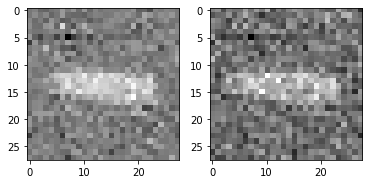

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value 1246.9242


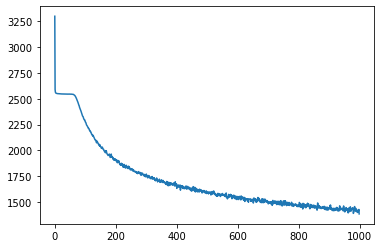

In [22]:
data_noisy, data_in_batch, timestep, losses, avg_params = train_model(opt_state, params, avg_params, 'emnist_large.jax_version', train_new_model = train_new_model, energy_method=False, cont=False)
plt.plot(losses)

## Full generation model

In [23]:
mean_coeff_1 = jnp.sqrt(alphas)*(1 - alphas_prev_) / variance
mean_coeff_2 = jnp.sqrt(alphas_prev_) * betas / variance

In [24]:
def generate_data(avg_params, energy_method=False, clipped_version=False, labels=None):
    batch_size_generation = 1
    key = jax.random.PRNGKey(42)
    
    # need to generate new keys everytime
    data_noisy = jax.random.normal(key, shape=(batch_size_generation, 28, 28, 1))
    data_orig = normalize(next(train)[0][0:batch_size_generation])
    data_noisy, _ = get_noisy(data_orig, jnp.array([timesteps]))
      
    datas = []
    datas.append(jax.device_get(data_noisy))
    data_in_batch = data_noisy
    key = jax.random.PRNGKey(42)
    subkeys = jax.random.split(key, timesteps)                                 
    for t in range(1, timesteps+1):
        timestep = timesteps-t
        t_repeated = jnp.repeat(jnp.array([timestep]), batch_size_generation)
        # data_stacked = torch.vstack([data_in_batch, labelled_values])
        pred_data = net.apply(avg_params, data_in_batch, t_repeated)
        if not clipped_version:
            if not energy_method:
                # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                multiplier = jnp.exp(jnp.log((betas[timestep])) - jnp.log(sd[timestep]))
                mean_data = jnp.subtract(data_in_batch, pred_data * multiplier)/jnp.sqrt(alphas[timestep])
            else:
                ##
                # Energy function interpretation
                mean_data = jnp.add(data_in_batch, pred_data * betas[timestep])/jnp.sqrt(alphas[timestep])
                ##
        else:
            # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
            # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
            if not energy_method:
                x_reconstructed = jnp.subtract(data_in_batch, pred_data * sd[timestep])/ jnp.sqrt(alphas_[timestep])
            else:
                # energy method and clipping to improve stabalization
                x_reconstructed = jnp.add(data_in_batch, pred_data * variance[timestep])/ jnp.sqrt(alphas_[timestep])

            if timestep >= 5:
                x_reconstructed = jnp.clip(x_reconstructed, -1., 1.)

            mean_data_1 = data_in_batch * mean_coeff_1[timestep]
            mean_data_2 = x_reconstructed * mean_coeff_2[timestep]
            mean_data = jnp.add(mean_data_1, mean_data_2)

        posterior_data = posterior_variance_corrected[timestep]
        data_noisy = jax.random.normal(subkeys[t], shape=(batch_size_generation, 28, 28, 1))
        data_in_batch = jnp.add(mean_data,  jnp.sqrt(posterior_data) * data_noisy)
        datas.append(jax.device_get(data_in_batch))
    return datas, data_in_batch, data_orig

In [25]:
datas, data_in_batch, data_orig = generate_data(avg_params, energy_method=False, clipped_version=True, labels="mixed")

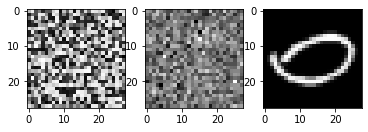

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

In [26]:
_, (plt1, plt2, plt3) = plt.subplots(1, 3)

show_image(unnormalize(data_in_batch[0]), plt1)
show_image(unnormalize(datas[0][0]), plt2)
show_image(unnormalize(data_orig[0]), plt3)

# data_noisy, _ = get_noisy(data_orig, jnp.array([60]))
# show_image(unnormalize(data_noisy[0]), plt1)

In [27]:
huber_loss(datas[0], data_orig), huber_loss(data_in_batch, data_orig), huber_loss(data_in_batch, datas[10])

(DeviceArray([478.24658], dtype=float32),
 DeviceArray([435.1557], dtype=float32),
 DeviceArray([464.2464], dtype=float32))

In [28]:
%%capture 

fig = plt.figure()
ims = []

if colab:
  datas = einops.rearrange(datas, 'x b h w c -> x b h (w c)')
  
for data in datas:
    im = plt.imshow(data[0], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir + 'diffusion_generation_full.gif', writer='pillow')

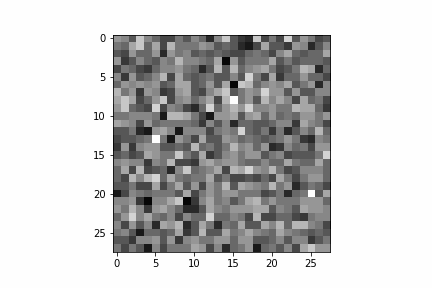

In [29]:
with open(gifs_dir + 'diffusion_generation_full.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

## strided sampling

In [30]:
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L196
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L78
posterior_variance = (betas) * (1 - alphas_prev_) / (1 - alphas_)
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance[1], posterior_variance[1:]]))
posterior_variance_corrected = jnp.exp(log_posterior_variance)

strided_schedule = jnp.array(list(range(1, timesteps, 1)) + [timesteps])

alphas_strided_ = alphas_[strided_schedule]
alphas_prev_strided_ = jnp.pad(alphas_strided_[:-1], [1, 0], "constant", constant_values=1.0)

betas_strided = 1 - (alphas_strided_/alphas_prev_strided_)
posterior_variance_new_schedule = betas_strided * (1 - alphas_prev_strided_)/ (1-alphas_strided_)
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance_new_schedule[1], posterior_variance_new_schedule[1:]]))
posterior_variance_new_schedule_corrected = jnp.exp(log_posterior_variance)

In [31]:
mean_coeff_1 = jnp.sqrt(1-betas_strided)*(1 - alphas_prev_strided_) / (1 - alphas_strided_)
mean_coeff_2 = jnp.sqrt(alphas_prev_strided_) * betas_strided / (1 - alphas_strided_)

In [32]:
def generate_data(avg_params, energy_method=False, clipped_version=False, labels=None):
    # final_step_data = get_noisy(data_transformed, timesteps-1)
    # mean_last_step = torch.mean(final_step_data, dim=1)
    # std_last_step = torch.std(final_step_data, dim=1)
    batch_size_generation = 1
    # (tensor([0.4086, 0.4253]), tensor([-0.6379,  0.0137])))
    key = jax.random.PRNGKey(42)
    # need to generate new keys everytime
    data_noisy = jax.random.normal(key, shape=(batch_size_generation, 28, 28, 1))
    data_orig = normalize(next(train)[0][0:batch_size_generation])
    data_noisy, _ = get_noisy(data_orig, jnp.array([timesteps]))
    
#     if not labels:
#       labelled_values = jnp.zeros((63, batch_size_generation))
#     elif labels=="circles":
#       labelled_values = torch.vstack([torch.ones(batch_size_generation), torch.zeros(batch_size_generation)])
#     elif labels=="moon":
#       labelled_values = torch.vstack([torch.zeros(batch_size_generation), torch.ones(batch_size_generation)])
#     elif labels=="mixed":
#       batch_size_generation_ = int(batch_size_generation/2)
#       labelled_values_1 = torch.vstack([torch.ones(batch_size_generation_), torch.zeros(batch_size_generation_)])
#       labelled_values_2 = torch.vstack([torch.zeros(batch_size_generation_), torch.ones(batch_size_generation_)])
#       labelled_values = torch.hstack([labelled_values_1, labelled_values_2])
      
    datas = []
    datas.append(jax.device_get(data_noisy))
    data_in_batch = data_noisy
    key = jax.random.PRNGKey(42)
    subkeys = jax.random.split(key, len(strided_schedule))                                 
    for t in range(1, len(strided_schedule)+1):
        stride_timestep = len(strided_schedule)-t
        timestep = strided_schedule[stride_timestep]
        t_repeated = jnp.repeat(jnp.array([timestep]), batch_size_generation)
        # data_stacked = torch.vstack([data_in_batch, labelled_values])
        pred_data = net.apply(avg_params, data_in_batch, t_repeated)
        if not clipped_version:
            if not energy_method:
                # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                multiplier = jnp.exp(jnp.log((betas_strided[stride_timestep])) - jnp.log(jnp.sqrt(1- alphas_strided_[stride_timestep])))
                mean_data = jnp.subtract(data_in_batch, pred_data * multiplier)/jnp.sqrt(1-betas_strided[stride_timestep])
            else:
                ##
                # Energy function interpretation
                mean_data = jnp.add(data_in_batch, pred_data * betas_strided[stride_timestep])/jnp.sqrt(1-betas_strided[stride_timestep])
                ##
        else:
            # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
            # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
            if not energy_method:
                x_reconstructed = jnp.subtract(data_in_batch, pred_data * sd[timestep])/ jnp.sqrt(alphas_[timestep])
            else:
                # energy method and clipping to improve stabalization
                x_reconstructed = jnp.add(data_in_batch, pred_data * variance[timestep])/ jnp.sqrt(alphas_[timestep])

            if timestep >= 5:
                x_reconstructed = jnp.clip(x_reconstructed, -1., 1.)

            mean_data_1 = data_in_batch * mean_coeff_1[stride_timestep]
            mean_data_2 = x_reconstructed * mean_coeff_2[stride_timestep]
            mean_data = jnp.add(mean_data_1, mean_data_2)



        posterior_data = posterior_variance_new_schedule_corrected[stride_timestep]
        data_noisy = jax.random.normal(subkeys[t], shape=(batch_size_generation, 28, 28, 1))
        data_in_batch = jnp.add(mean_data,  jnp.sqrt(posterior_data) * data_noisy)
        datas.append(jax.device_get(data_in_batch))
    return datas, data_in_batch, data_orig

In [33]:
datas, data_in_batch, data_orig = generate_data(avg_params, energy_method=False, clipped_version=False, labels="mixed")

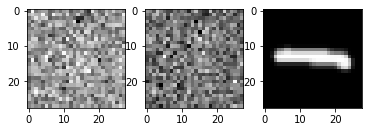

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

In [34]:
_, (plt1, plt2, plt3) = plt.subplots(1, 3)

show_image(unnormalize(data_in_batch[0]), plt1)
show_image(unnormalize(datas[0][0]), plt2)
show_image(unnormalize(data_orig[0]), plt3)

# data_noisy, _ = get_noisy(data_orig, jnp.array([60]))
# show_image(unnormalize(data_noisy[0]), plt1)

In [35]:
huber_loss(datas[0], data_orig), huber_loss(data_in_batch, data_orig), huber_loss(data_in_batch, datas[50])

(DeviceArray([473.04858], dtype=float32),
 DeviceArray([9325.954], dtype=float32),
 DeviceArray([6442.2188], dtype=float32))

In [36]:
%%capture 

fig = plt.figure()
ims = []

if colab:
  datas = einops.rearrange(datas, 'x b h w c -> x b h (w c)')
  
for data in datas:
    im = plt.imshow(data[0], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir + 'diffusion_generation_strided.gif', writer='pillow')

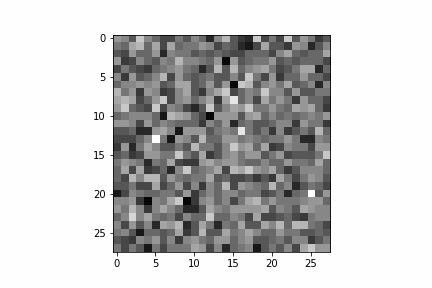

In [37]:
with open(gifs_dir + 'diffusion_generation_strided.gif','rb') as f:
  display(Image(data=f.read(), format='png'))